# 2216 - Catchy tilte

## Imports

## Used Funcitons

In [1]:

from sklearn.model_selection import GridSearchCV
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

import numpy as np
import os
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.initializers import HeNormal, HeUniform
import tensorflow as tf
# tf.get_logger().setLevel('ERROR')
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 16
# Dimension of data
L = 2

### Creating Data and Rescaling

In [34]:
def rescale(x,x_ref,RTYPE = 2):
    """
    Returns a copy of the x-data rescale acording to TYPE

    inputs
    ----------
    x : data array of d
    x : data array that the rescaling is done wrt.
    RTYPE : determines what type of rescaling is used
        - 0 - divide by 50 
        - 1 - normalize based on max and min of x_ref
        - 2 - standarize based on avg and std of x_ref (default)
    """
    x_out = np.zeros(x.shape)
    if RTYPE == 0:
        x_out = np.copy(x)/50
        return x_out
    
    if RTYPE == 1:
        for i in range(L):
            x_out[:,i] = (x[:,i]-np.max(x_ref[:,i]))/(-np.max(x_ref[:,i])+np.min(x_ref[:,i]))*2-1
        return x_out
    if RTYPE == 2:
        for i in range(L):
            x_out[:,i] = (x[:,i]-np.mean(x_ref[:,i]))/(np.std(x_ref[:,i]))
        return x_out


def non_linear_func(x ,TYPE = 0):
    """
    returns labels of x, based on what TYPE of func used
    
    inputs
    ----------
    x : data array
    TYPE : determines func used
        - 0 : triangle
        - 1 : circle
        - 2 : sinisodial boundary
    """
    r= np.zeros(x.shape[0])
    if TYPE == 0:
        # Triangle
        for i,x_i in enumerate(x):
            r[i] = x_i[0]>-20 and x_i[1]>-40 and x_i[0]+x_i[1] < 40
        
    if TYPE == 1:
        for i,x_i in enumerate(x):
            r[i] = x_i[0]*x_i[0] + x_i[1]*x_i[1] < 30*30
    
    if TYPE == 2:
        for i,x_i in enumerate(x):
            r[i] = x_i[1] > np.sin(2*np.pi/100 *(x_i[0]-50))*25
            
    return r

def create_datapoints(N=4000,L=L,B=100,TYPE = 0):
    """
    Creates datapoints and returns x,y

    Inputs
    ----------
    N : number of datapoints, default 4000
    L : size of each sample, default 2
    B : box size, default 100
    TYPE : type of labeling, passed to non_linear_func

    Outputs
    ---------
    x : np.array of shape (N,L) with data, NOT RESCALED
    y : np.array of shape (N,) with labels from non_linear_func
    """
    x = (np.random.random((N,L))-0.5)*B
    y = non_linear_func(x,TYPE = TYPE)
    return x,y

def create_datasets(N_train=3200,N_valid = 800,L=L,B=100,TYPE = 0,RTYPE = 2):
    """
    Creates datapoints and returns data sets for training and validation already rescaled

    Inputs
    ----------
    N_test : number of test datapoints, default 3200
    N_valid : number of validation datapoints, default 800
    L : size of each sample, default 2
    B : box size, default 100
    TYPE : type of labeling, passed to non_linear_func
    RTYPE : type of rescaling, passed to rescale

    Outputs
    ---------
    x_train,y_train,x_val,y_val

    """
    x,y = create_datapoints(N= N_valid+N_train,L=L,B=B,TYPE=TYPE)

    x_train, y_train =rescale(x[:N_train],x[:N_train],RTYPE=RTYPE) ,y[:N_train]
    x_valid, y_valid =rescale(x[N_train:],x[:N_train],RTYPE=RTYPE), y[N_train:]
    
    return x_train,y_train,x_valid,y_valid


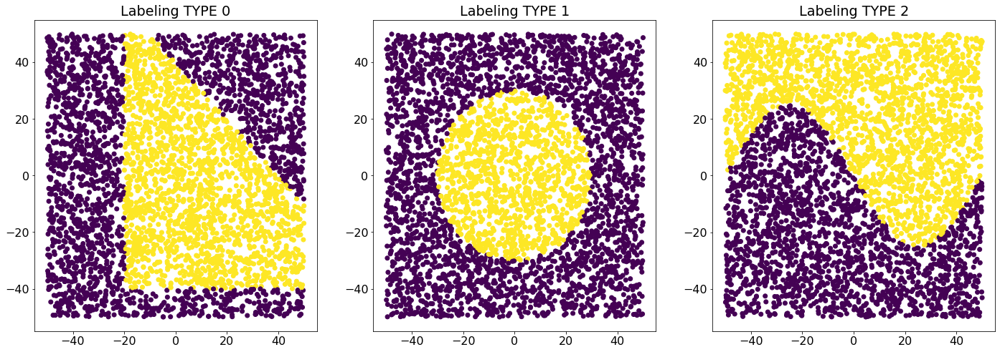

In [35]:
# Demonstrating data
fig,axs = plt.subplots(1,3,figsize=(24,8))
for TYPE in range(3):
    x,y = create_datapoints(TYPE = TYPE)
    axs[TYPE].scatter(x[:,0],x[:,1],c=y)
    axs[TYPE].set_title(f"Labeling TYPE {TYPE}")
plt.show()

### Model Creation

In [4]:
def create_model(optimizer = "adam",
    hidden_layers = 4,
    number_of_nodes = 10,
    dropout = 0,
    activation = 'relu',
    weight_init = 'glorot_uniform'
    ):
    """
    returns a complied model with the given parameters

    inputs
    ----------
    optimizer : optimizer passed when compiled default='adam'
    hidden_layers : number of hidden layers in the model default = 4
    num_nodes : number of nodes in the hidden layers default = 10
    dropout : dropout rate for the hidden layers default = 0
    activation : activation function in the hidden layers default = 'relu'
    weight_init : weight initialization in the hidden layers default = 'glorot_uniform'

    """
    model = Sequential()
    model.add(Dense(L,input_shape=(L,),activation = 'relu'))
    for i in range(hidden_layers):
        model.add(Dense(number_of_nodes,
            activation=activation,
            kernel_initializer=weight_init
        )
        )
        model.add(Dropout(dropout))

    model.add(Dense(1,activation='sigmoid'))
    model.compile(loss= 'binary_crossentropy',
    optimizer = optimizer,
    metrics = ['accuracy'])
    return model

BATCH_SIZE = 16
BATCH_SIZE_GS = 64
EPOCHS = 200
N_TRAIN = 3200
N_VALID = 800


### Visualisation

In [5]:
def plot_fit_series(fits, parameters, label_extra, yscale='linear'):
    """
    plot the epoch history of accuracy and loss of the fited models present
    in fits, calles show()

    inputs
    ----------
    fits : list of the 'tensorflow.python.keras.callbacks.History' objects returned
        by the fit function
    parameters : the spesifier telling what to label members of list by
    label_extra : function that takes in member of parameters and retunes a string to
        specifying how to label
    yscale : set what scale on y-axis is used default = 'linear'
    
    """
    fig,axs = plt.subplots(1,2,figsize = (16,8))
    colors = [plt.get_cmap("tab10")(i) for i in range(np.array(parameters).size)]
    ax = axs[0]
    for fit,parameter,color in zip(fits,parameters,colors):
        label_extra_str = label_extra(parameter)
        ax.plot(fit.history["accuracy"],color = color,ls='--' ,label="Acc"+label_extra_str)
        ax.plot(fit.history["val_accuracy"],label=f"Val Acc"+label_extra_str,color = color)
    ax.grid()
    ax.set_ylim(top=1)
    ax.set_yscale(yscale)
    ax.legend()

    ax = axs[1]
    for fit,parameter,color in zip(fits,parameters,colors):
        label_extra_str = label_extra(parameter)
        ax.plot(fit.history["loss"],color = color,ls='--' ,label=f"Loss"+label_extra_str)
        ax.plot(fit.history["val_loss"],label=f"Val Loss"+label_extra_str,color = color)
    ax.grid()
    # ax.set_ylim(bottom=0)
    ax.set_yscale(yscale)
    ax.legend()
    plt.tight_layout()
    plt.show()

def print_grid_search_results(grid,n = 10):
    """
    print the i'th best results of the grid search
    
    input
    ----------
    grid : the grid object after the fit has been called
    """
    means = grid.cv_results_['mean_test_score']
    stds = grid.cv_results_['std_test_score']
    params = np.array(grid.cv_results_['params'])
    mean_times = grid.cv_results_['mean_fit_time']
    std_times = grid.cv_results_['std_test_score']
    
    permutation = means.argsort()
    means = means[permutation]
    stds = stds[permutation]
    params = params[permutation]
    mean_times = mean_times[permutation]
    std_times = std_times[permutation]
    i = -10
    for mean, stdev, param,mean_time,std_time in zip(means[i:], 
        stds[i:],
        params[i:],
        mean_times[i:],
        std_times[i:]
        ):
        print("%f (%f) in %f (%f) s with: %r" % (mean, stdev, mean_time,std_time, param))


### Default weights

In [6]:
WEIGHTS_DEF_DIR = "weights_default"
N_INIT_WEIGHTS = 10

def weights_def_filepath(i,architecture_name = "default"):
    """
    returns the i'th(zero indexed) filepath the default initial weights
    """
    return os.path.join(WEIGHTS_DEF_DIR,architecture_name,f"weights_def_{i}.h5")

def make_weights_def(architecture_name = "default",N_init_weights = N_INIT_WEIGHTS,**kwargs):
    """
    fils the folder with the architecture name with N_init_weights files, the model
    used is specified by the kwarg passed to create_model. Note folder has to be pressent
    """
    for n in range(N_init_weights):
        model = create_model(**kwargs)
        model.save_weights(weights_def_filepath(n,architecture_name=architecture_name))

# make_weights_def() # already made


### Analysis

## Effect of training set

### Number of training samples

In [23]:
model = create_model()

N_trains = [100,200,400,800,1600,3200,6400,12800]
opt_acc = np.zeros((N_INIT_WEIGHTS,len(N_trains)))
fits = []
for n in range(N_INIT_WEIGHTS):
    fits_current = []
    for m,N_train in enumerate(N_trains):
        model.load_weights(weights_def_filepath(n))
        x_train,y_train,x_valid,y_valid = create_datasets(N_train=N_train)
    
        fits_current.append(model.fit(x_train,y_train,
            batch_size=BATCH_SIZE,
            epochs=EPOCHS,
            validation_data= (x_valid,y_valid),
            verbose = 0,
            )
        )
        opt_acc[n,m] = np.max(fits_current[-1].history["val_accuracy"])
    fits.append(fits_current)

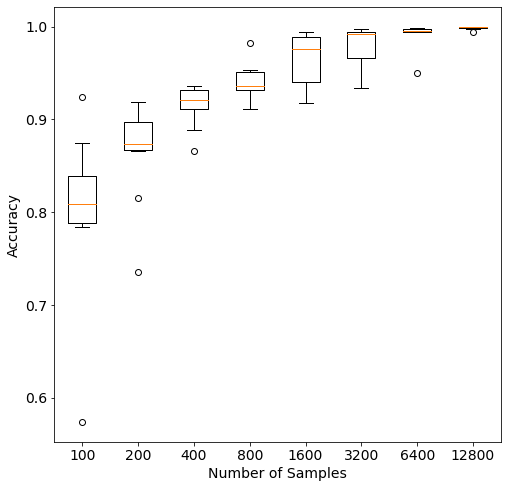

Initial weights 0


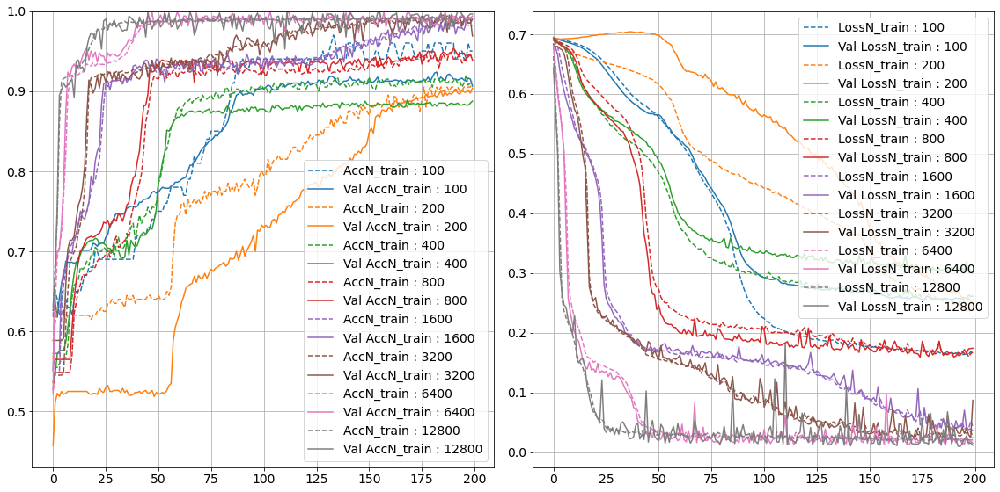

Initial weights 1


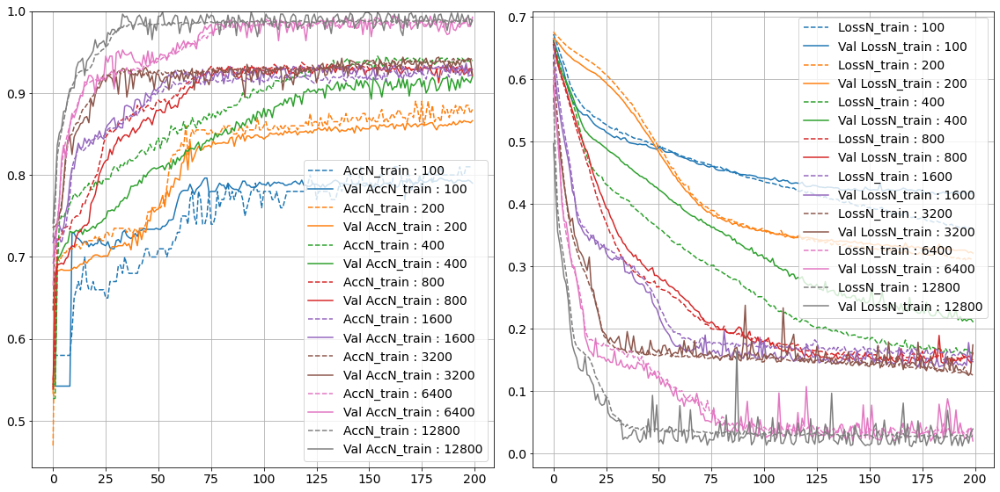

Initial weights 2


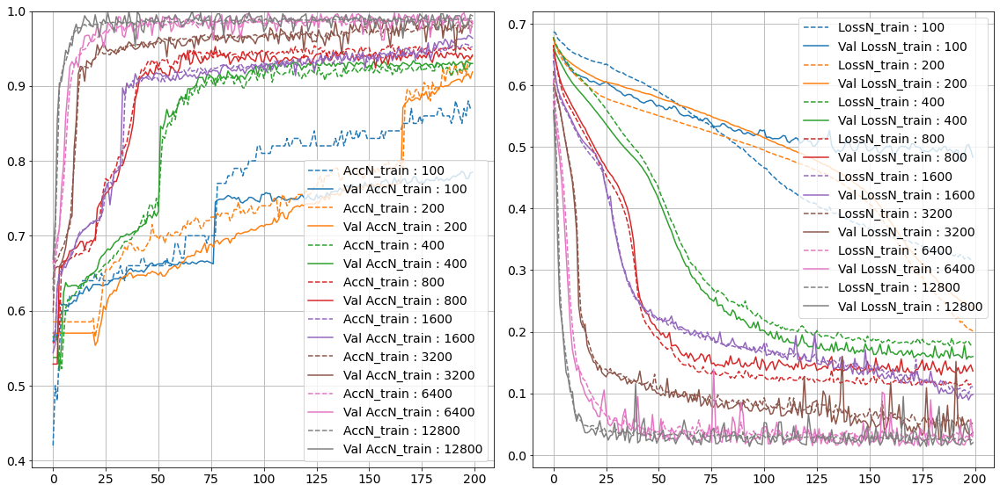

Initial weights 3


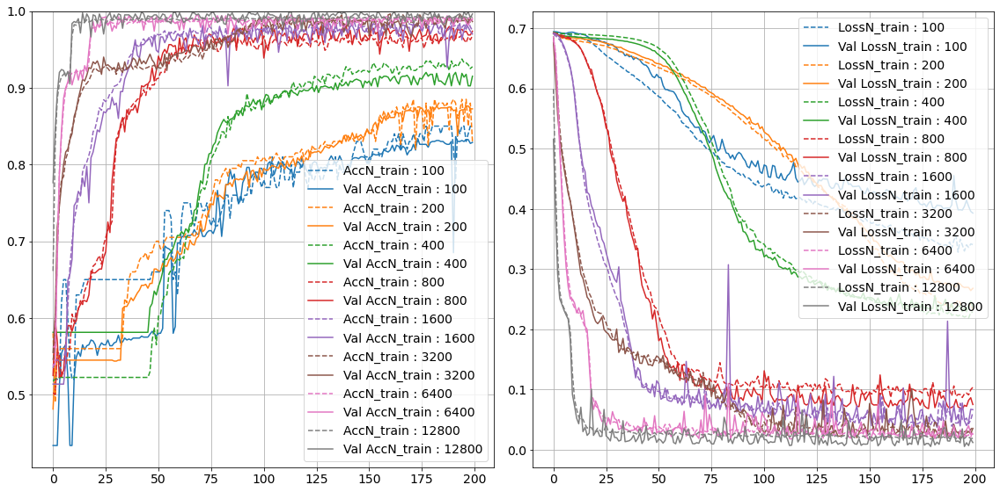

Initial weights 4


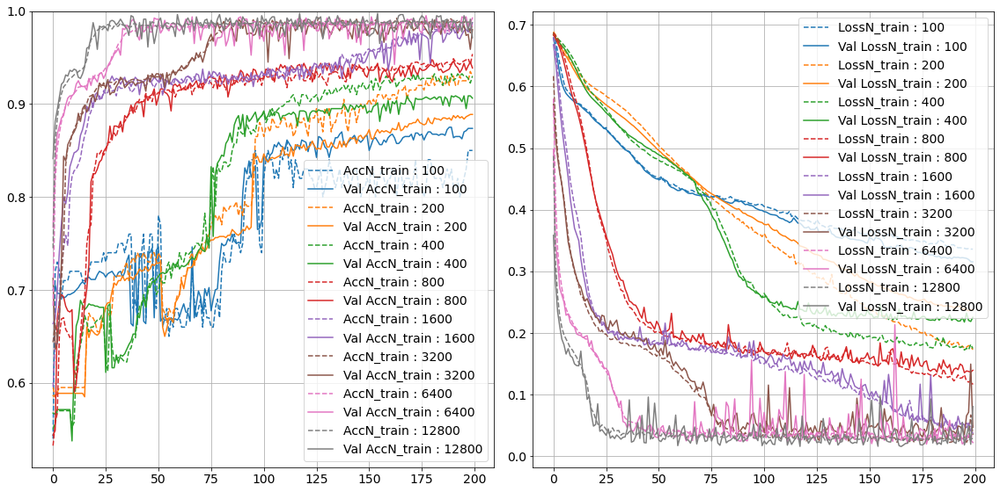

Initial weights 5


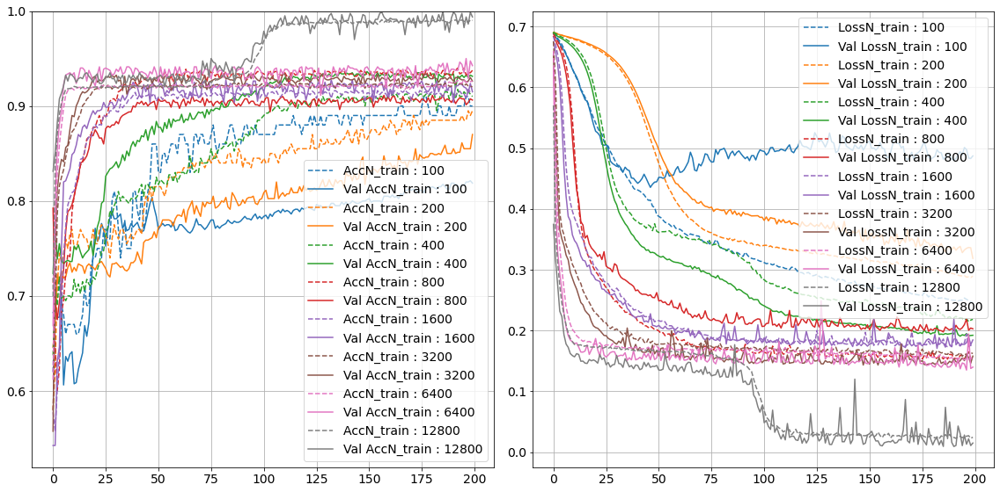

Initial weights 6


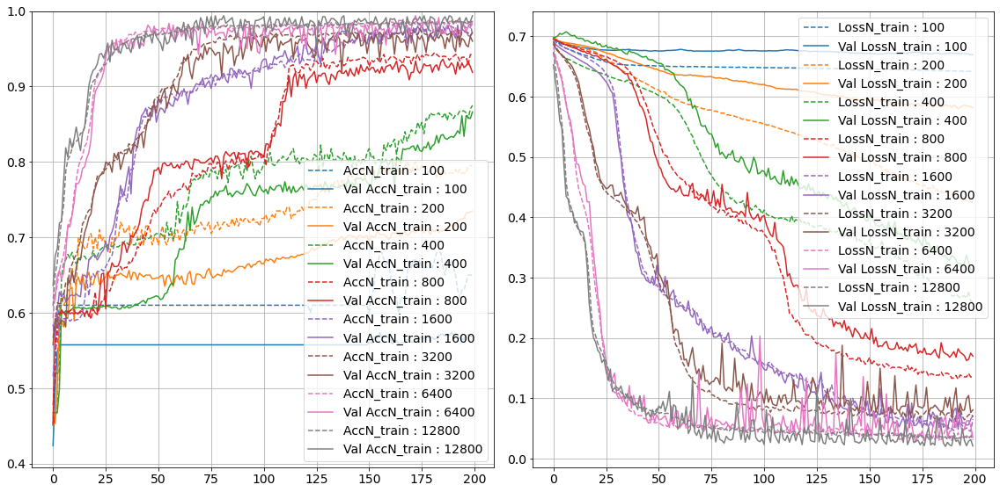

Initial weights 7


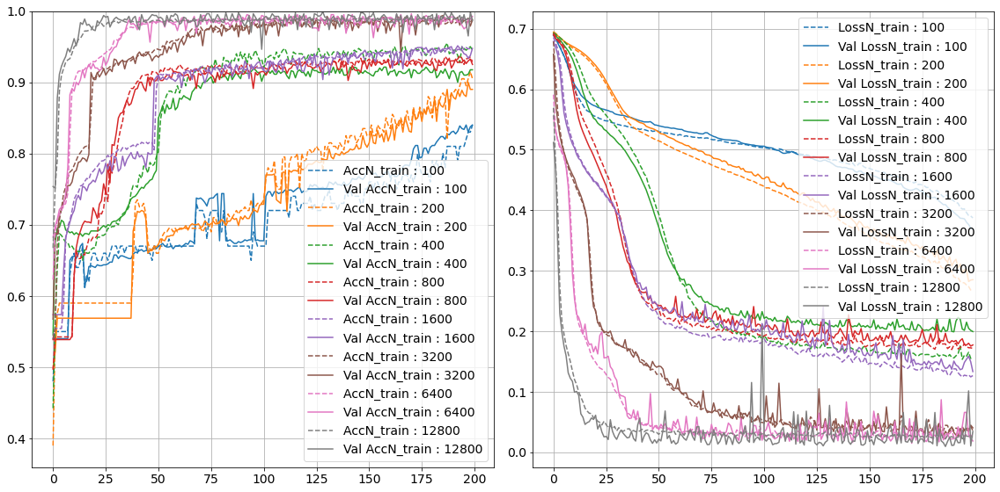

Initial weights 8


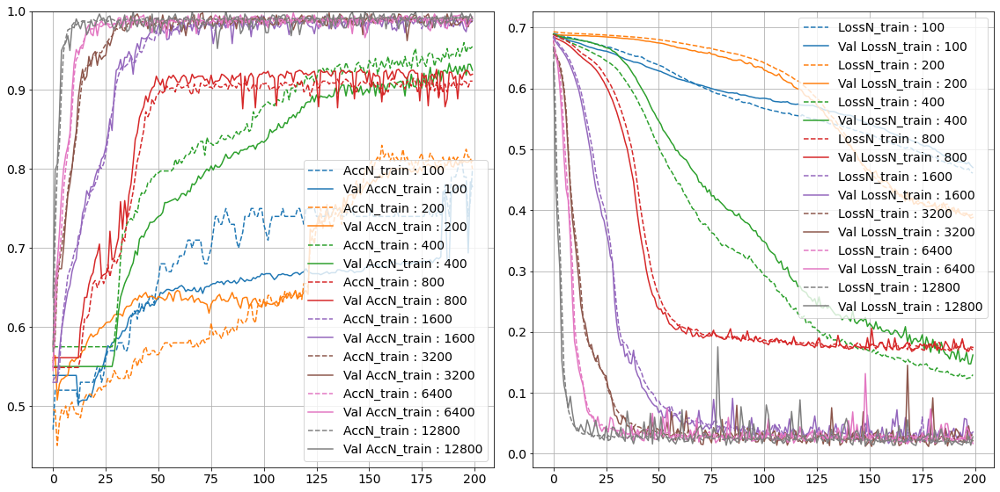

Initial weights 9


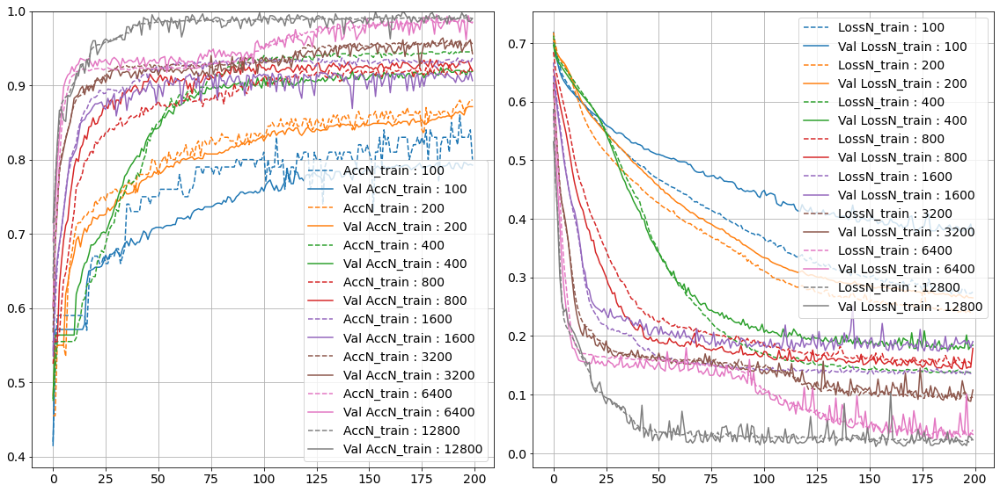

In [25]:
fig,ax = plt.subplots(1,1,figsize = (8,8))
np.save(os.path.join("saved_models","num_samples_acc_source_nepoch200_node20_hl4"),opt_acc)
ax.boxplot(opt_acc)
ax.set_xticklabels(N_trains)
ax.set_xlabel("Number of Samples")
ax.set_ylabel("Accuracy")
plt.savefig(os.path.join("figures","num_train_box.pdf"))
plt.show()
for n in range(N_INIT_WEIGHTS):
    print(f"Initial weights {n}")
    plot_fit_series(fits[n],N_trains,lambda x: f"N_train : {x}")


### Agumenting training samples

In [11]:
def agument_data(org_x_train,org_y_train ,multiplier = 1, epsilon = 5e-2):
    """
    returns features and labels with agumented data

    inputs
    ----------
    org_x_train : array with the original training data
    org_y_train : array with the original training labels
    multiplier : number of extra samples per original
    epsilon : The limits of the uniform random number added to the agumented samples

    """
    org_N = org_x_train.shape[0]
    org_L = org_x_train.shape[1]
    x_train_agumented = np.zeros((org_N*(1+multiplier),org_L))
    y_train_agumented = np.zeros((org_N*(1+multiplier)))
    
    x_train_agumented[:org_N] = np.copy(org_x_train)
    y_train_agumented[:org_N] = np.copy(org_y_train)
    
    # Filling the rest of the array
    for i in range(multiplier):
        x_train_agumented[(i+1)*org_N:(i+2)*org_N] = np.copy(org_x_train)+ np.random.uniform(-epsilon,epsilon,size=(org_N,org_L))
        y_train_agumented[(i+1)*org_N:(i+2)*org_N] = np.copy(org_y_train)
    
    # Shuffeling the data
    permutation = np.random.permutation(x_train_agumented.shape[0])
    x_train_agumented = x_train_agumented[permutation]
    y_train_agumented = y_train_agumented[permutation]

    return x_train_agumented,y_train_agumented

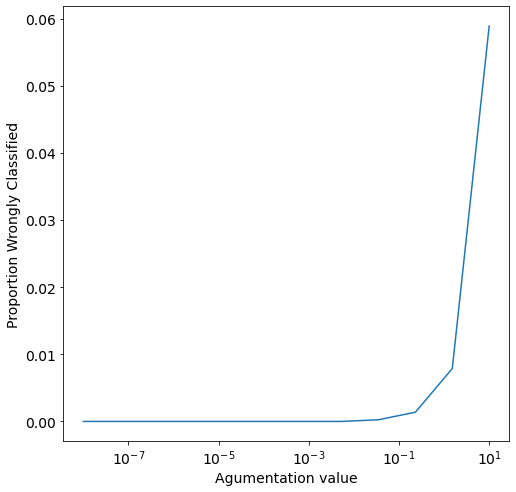

multiplier 0, portion wrongly labeled: 0.0
multiplier 1, portion wrongly labeled: 0.0
multiplier 2, portion wrongly labeled: 0.0003333333333333333
multiplier 3, portion wrongly labeled: 0.000375
multiplier 4, portion wrongly labeled: 0.00045
multiplier 5, portion wrongly labeled: 0.0003333333333333333
multiplier 6, portion wrongly labeled: 0.00025
multiplier 7, portion wrongly labeled: 0.00046875
multiplier 8, portion wrongly labeled: 0.0005833333333333334
multiplier 9, portion wrongly labeled: 0.000575


In [12]:
# Choosing values for multipliers
x_train,y_train = create_datapoints()

epsilons = np.logspace(-8,1,12)
prop_wrong_classified = []

for epsilon in epsilons:
    x_train_agumented,y_train_agumented = agument_data(x_train,y_train,epsilon=epsilon)
    y_train_actual = non_linear_func(x_train_agumented)
    prop_wrong_classified.append(np.average(abs(y_train_agumented-y_train_actual)))

fig,ax = plt.subplots(1,1,figsize = (8,8))
ax.plot(epsilons,prop_wrong_classified)
ax.set_xlabel("Agumentation value")
ax.set_ylabel("Proportion Wrongly Classified")
ax.set_xscale('log')
plt.show()


for multiplier in range(10):
    x_train_agumented,y_train_agumented = agument_data(x_train,y_train,multiplier=multiplier)
    y_train_actual = non_linear_func(x_train_agumented)
    print(f"multiplier {multiplier}, portion wrongly labeled:",np.average(abs(y_train_agumented-y_train_actual)))


In [13]:
model = create_model()

x_train,y_train = create_datapoints(N=N_TRAIN)
x_valid,y_valid = create_datapoints(N=N_VALID)

multipliers = [0,1,2,4,16]

opt_acc_ag = np.zeros((N_INIT_WEIGHTS,len(multipliers)))
fits_ag = []
for n in range(N_INIT_WEIGHTS):
    fits_current = []
    for m,multiplier in enumerate(multipliers):
        x_train_agumented,y_train_agumented = agument_data(
            x_train,y_train,
            multiplier=multiplier,
            epsilon=epsilon
            )
        x_train_ag = rescale(x_train_agumented,x_train_agumented)
        x_valid_ag = rescale(x_valid,x_train_agumented)

        model.load_weights(weights_def_filepath(n))

        fits_current.append(model.fit(
            x_train_ag,y_train_agumented,
            batch_size=BATCH_SIZE,
            epochs=EPOCHS,
            validation_data= (x_valid_ag,y_valid),
            verbose = 0,
            )
        )
        opt_acc_ag[n,m] = np.max(fits_current[-1].history["val_accuracy"])
    fits_ag.append(fits_current)
    print(f"Done {n+1}/{N_INIT_WEIGHTS}")


Done 1/10
Done 2/10
Done 3/10
Done 4/10
Done 5/10
Done 6/10
Done 7/10
Done 8/10
Done 9/10
Done 10/10


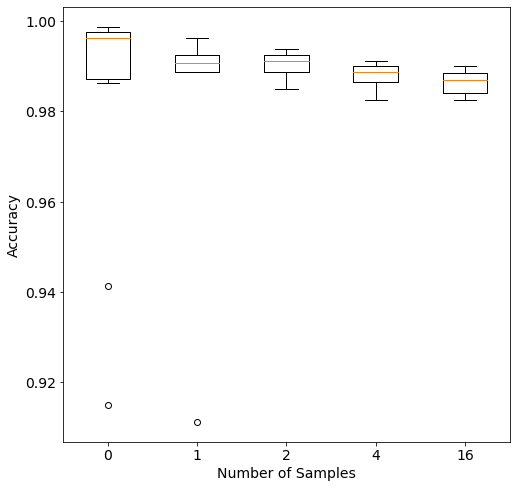

Initial weights 0


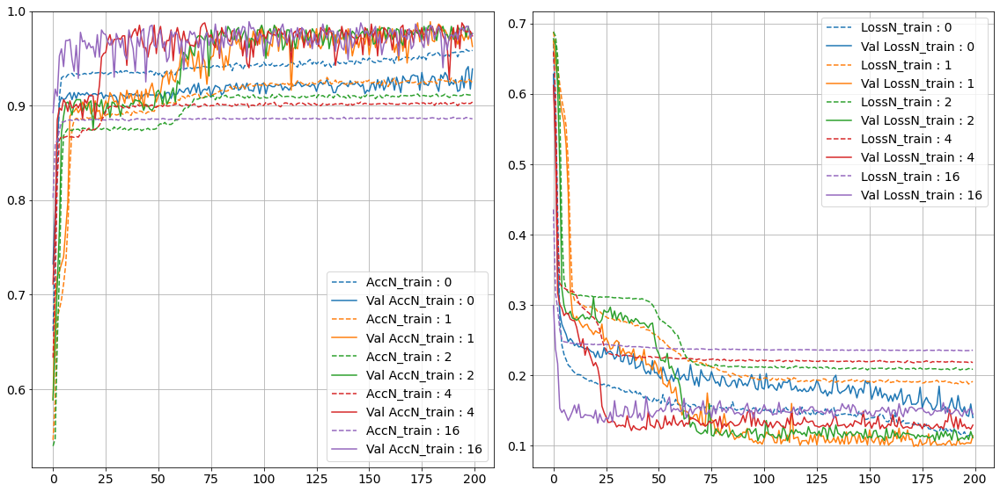

Initial weights 1


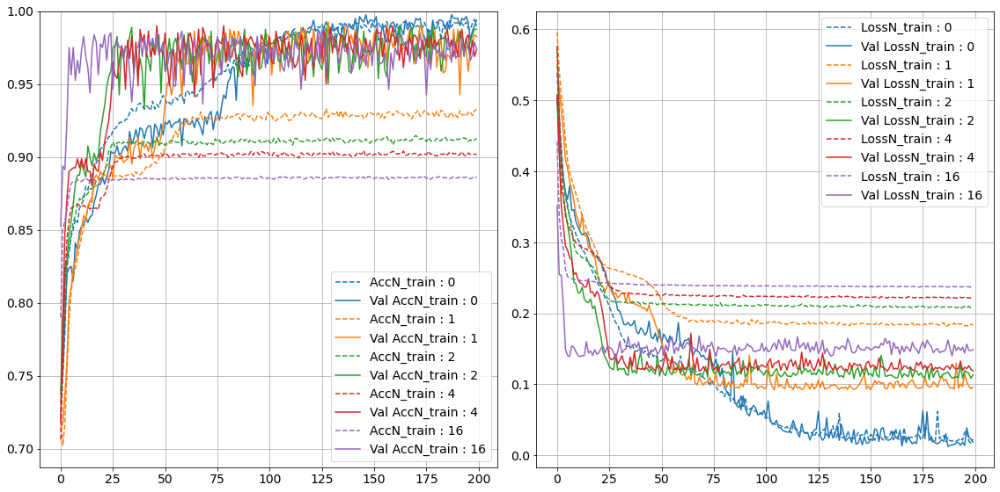

Initial weights 2


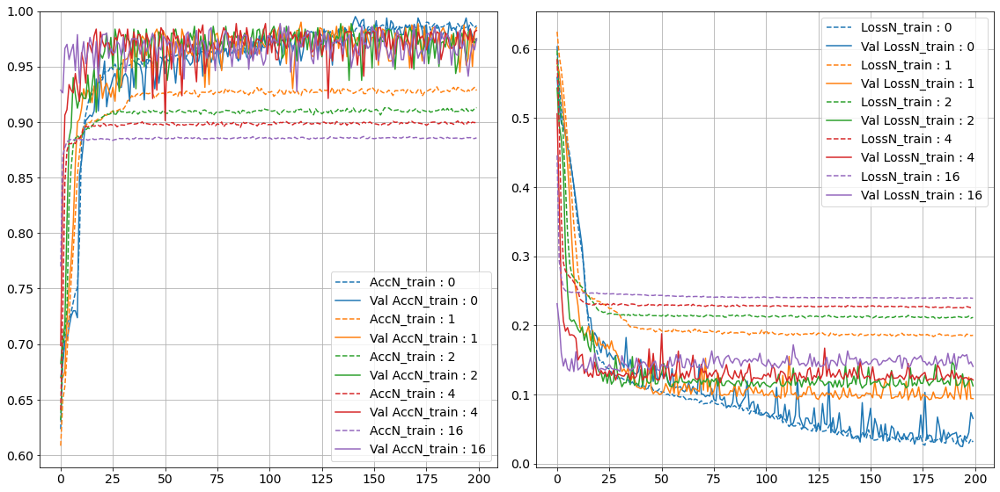

Initial weights 3


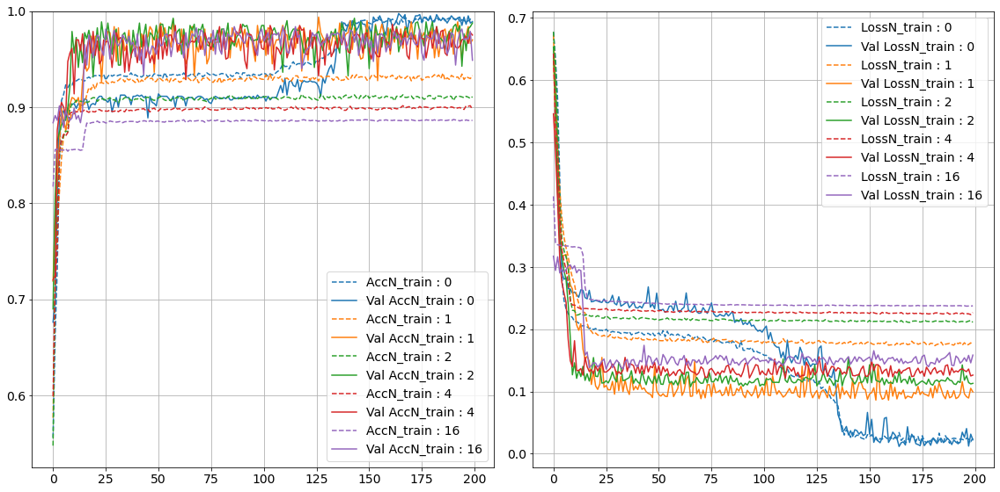

Initial weights 4


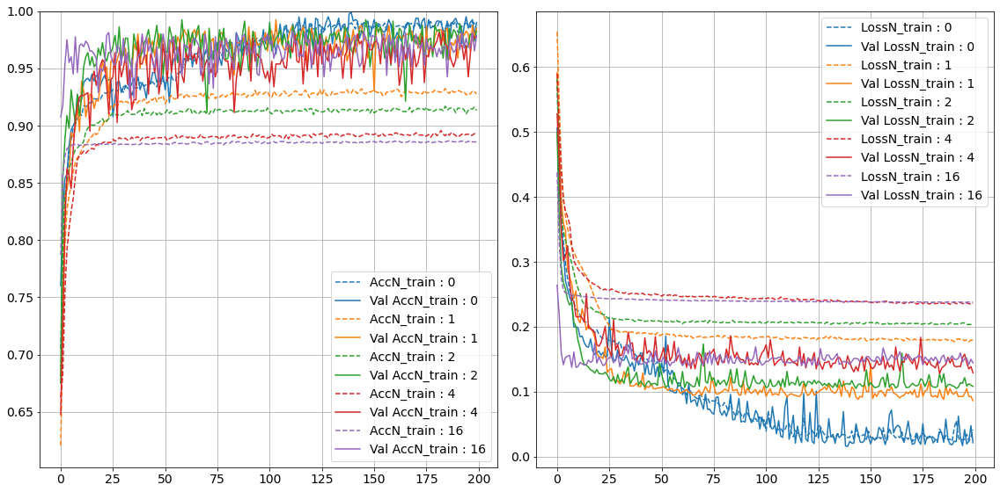

Initial weights 5


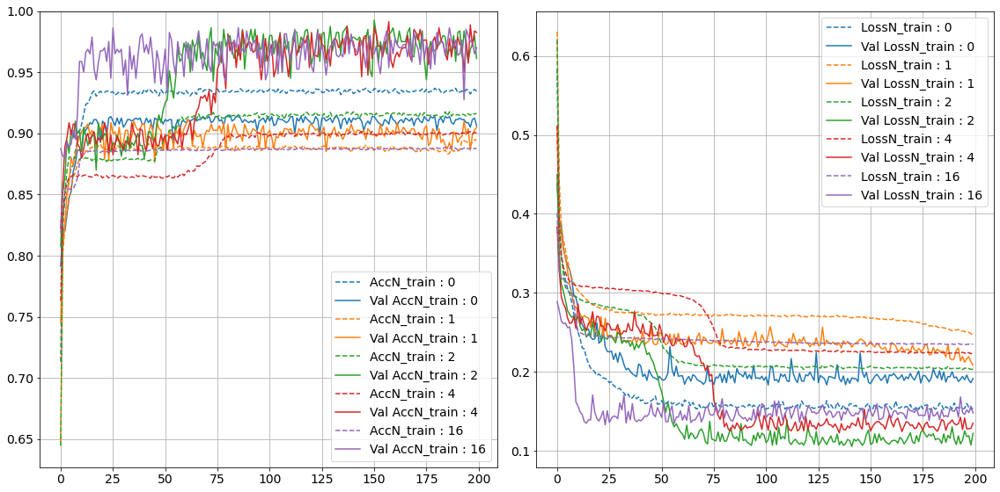

Initial weights 6


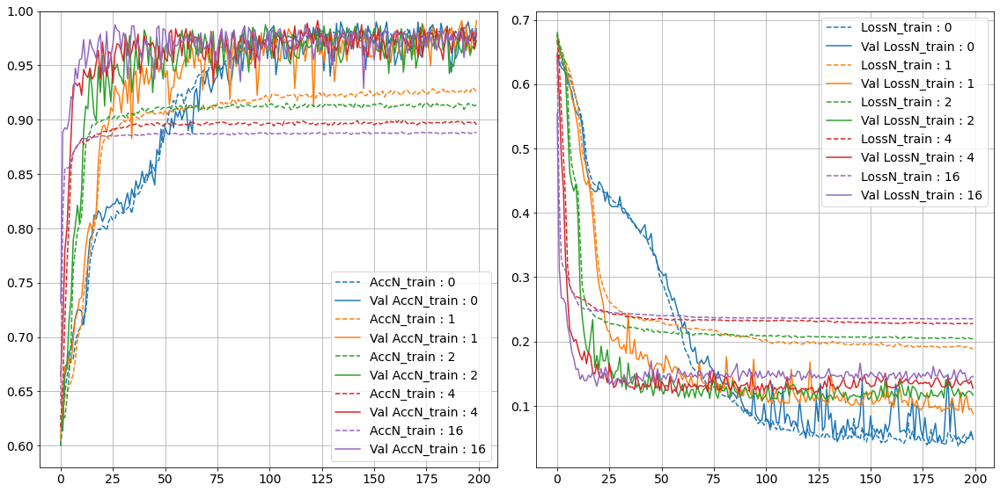

Initial weights 7


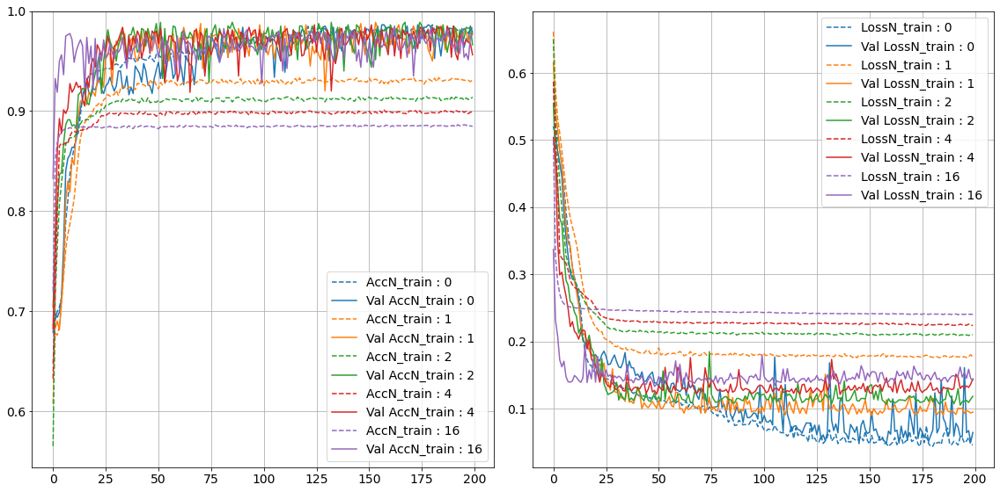

Initial weights 8


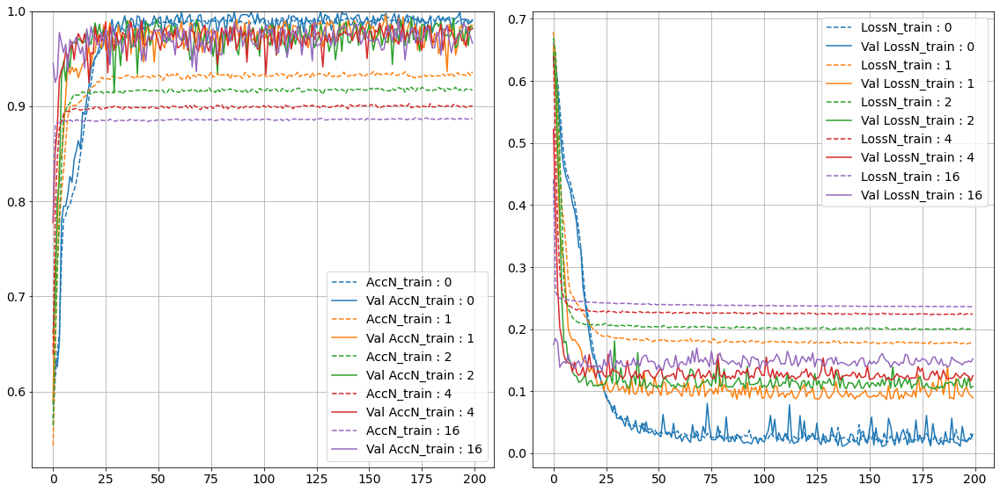

Initial weights 9


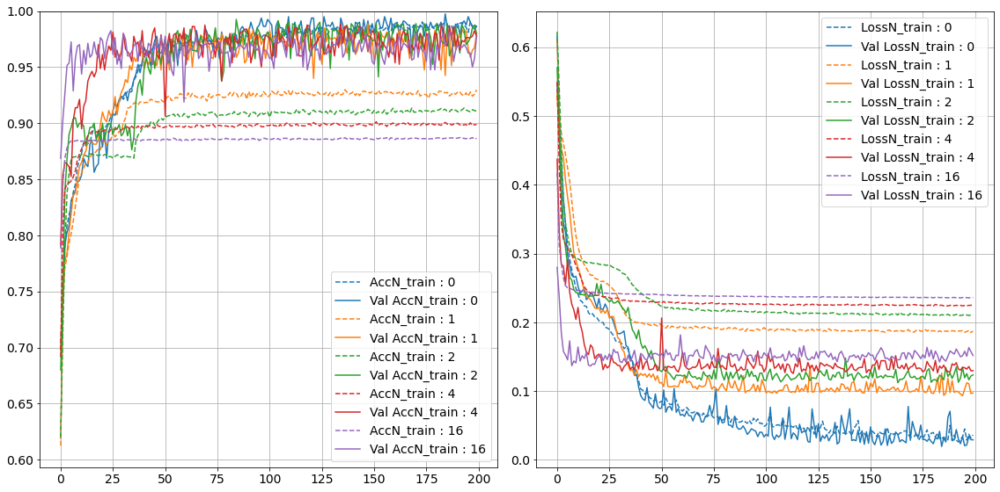

In [17]:
fig,ax = plt.subplots(1,1,figsize = (8,8))
np.save(os.path.join("saved_models","ag_samples_acc_source_nepoch200_node20_hl4"),opt_acc_ag)
ax.boxplot(opt_acc_ag)
ax.set_xticklabels(multipliers)
ax.set_xlabel("Agumented data per data sample")
ax.set_ylabel("Accuracy")
plt.savefig(os.path.join("figures","ag_train_box.pdf"))
plt.show()

for n in range(N_INIT_WEIGHTS):
    print(f"Initial weights {n}")
    plot_fit_series(fits_ag[n],multipliers,lambda x: f"N_train : {x}")

## Gridsearch for optimal network

### Optimal Architecture

In [7]:
hidden_layers = [2,3,4]
number_of_nodes = [10,20,40]
dropouts = [0, 0.1]
activations = ['relu','elu'] # sigmoid excluded since earlier trials show considebly lower performace



param_grid = dict(
    hidden_layers =hidden_layers,
    number_of_nodes = number_of_nodes,
    dropout = dropouts,
    activation = activations
)

x_train,y_train,x_valid,y_valid = create_datasets()

model_arcitecture_search = KerasClassifier(
    build_fn = create_model,
    verbose = 0
    )

grid_arcitecture = GridSearchCV(
    model_arcitecture_search,
    param_grid = param_grid,
    )

grid_arcitecture_result = grid_arcitecture.fit(
    x_train,y_train,
    epochs = EPOCHS,
    batch_size = BATCH_SIZE_GS,
    validation_data=(x_valid,y_valid),
    )

In [8]:
# results_architecture = pd.DataFrame.from_dict(grid_arcitecture_result.cv_results_)
# results_architecture.to_csv(os.path.join("saved_models",'grid_search_architecture_results.csv'))

# Display best result
print_grid_search_results(grid_arcitecture_result)


0.950000 (0.025977) in 9.951454 (0.025977) s with: {'activation': 'elu', 'dropout': 0.1, 'hidden_layers': 4, 'number_of_nodes': 20}
0.950937 (0.028239) in 9.542638 (0.028239) s with: {'activation': 'relu', 'dropout': 0, 'hidden_layers': 4, 'number_of_nodes': 20}
0.952812 (0.031583) in 9.114396 (0.031583) s with: {'activation': 'relu', 'dropout': 0, 'hidden_layers': 2, 'number_of_nodes': 40}
0.953437 (0.023664) in 9.516659 (0.023664) s with: {'activation': 'relu', 'dropout': 0.1, 'hidden_layers': 2, 'number_of_nodes': 40}
0.954375 (0.020310) in 8.936375 (0.020310) s with: {'activation': 'relu', 'dropout': 0.1, 'hidden_layers': 2, 'number_of_nodes': 20}
0.956563 (0.017963) in 10.959149 (0.017963) s with: {'activation': 'elu', 'dropout': 0, 'hidden_layers': 4, 'number_of_nodes': 40}
0.957812 (0.024626) in 9.050723 (0.024626) s with: {'activation': 'relu', 'dropout': 0, 'hidden_layers': 3, 'number_of_nodes': 20}
0.958750 (0.013750) in 9.775638 (0.013750) s with: {'activation': 'relu', 'dro

In [10]:
means = grid_arcitecture_result.cv_results_['mean_test_score']

permutation = means.argsort()
params_top3 = [grid_arcitecture_result.cv_results_['params'][permutation[i]] for i in range(-3,0)] 
fits_architecture = []

x_train,y_train,x_valid,y_valid = create_datasets()

best_acc = np.zeros((N_INIT_WEIGHTS,len(params_top3)))
for n in range(N_INIT_WEIGHTS):
    fits_current = []
    for i,params_top in enumerate(params_top3):
        model = create_model(
            activation = params_top["activation"],
            dropout = params_top["dropout"],
            hidden_layers=params_top["hidden_layers"],
            number_of_nodes=params_top["number_of_nodes"]
            )
        
        # Note cannot set initial weights since different architecture

        fits_current.append(model.fit(x_train,y_train,
            epochs = EPOCHS,
            batch_size = BATCH_SIZE,
            validation_data=(x_valid,y_valid),
            verbose = 0))
        best_acc[n,i] = np.max(fits_current[-1].history["val_accuracy"])
    fits_architecture.append(fits_current)
    print(f"Done {n+1}/{N_INIT_WEIGHTS}")

Done 1/10
Done 2/10
Done 3/10
Done 4/10
Done 5/10
Done 6/10
Done 7/10
Done 8/10
Done 9/10
Done 10/10


0.9768749833106994 0.02948648270764332 {'activation': 'relu', 'dropout': 0, 'hidden_layers': 3, 'number_of_nodes': 40}
0.9802499949932099 0.026385363761853402 {'activation': 'relu', 'dropout': 0, 'hidden_layers': 4, 'number_of_nodes': 10}
0.987749981880188 0.019967161273591886 {'activation': 'relu', 'dropout': 0, 'hidden_layers': 4, 'number_of_nodes': 40}


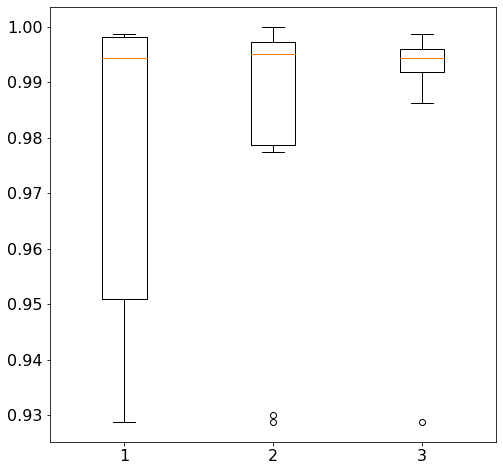

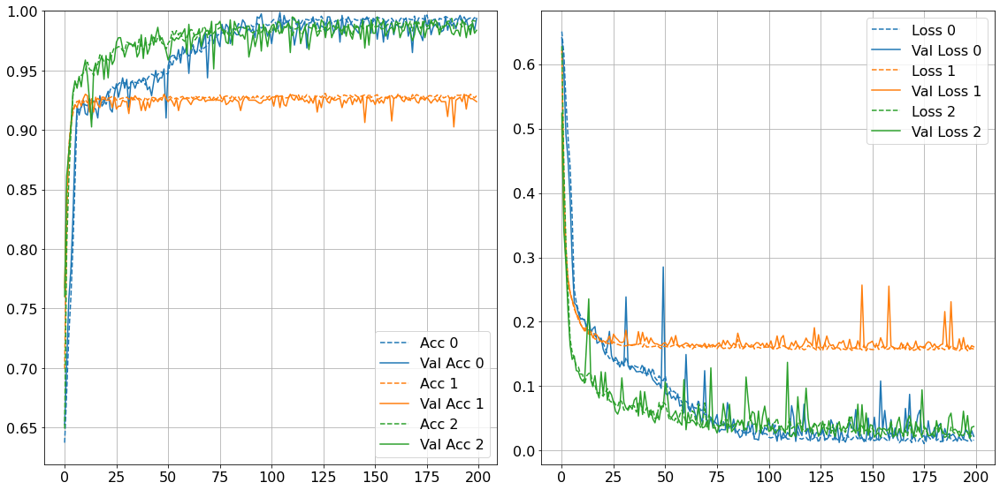

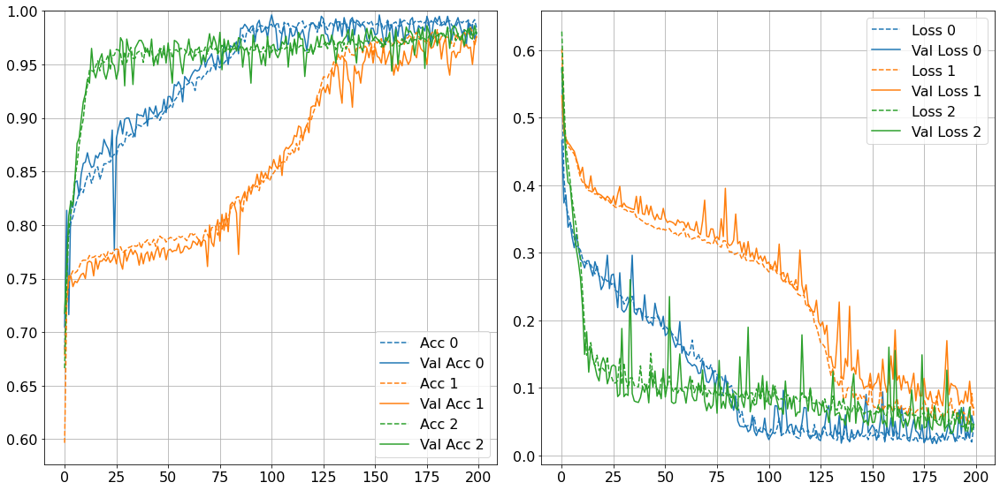

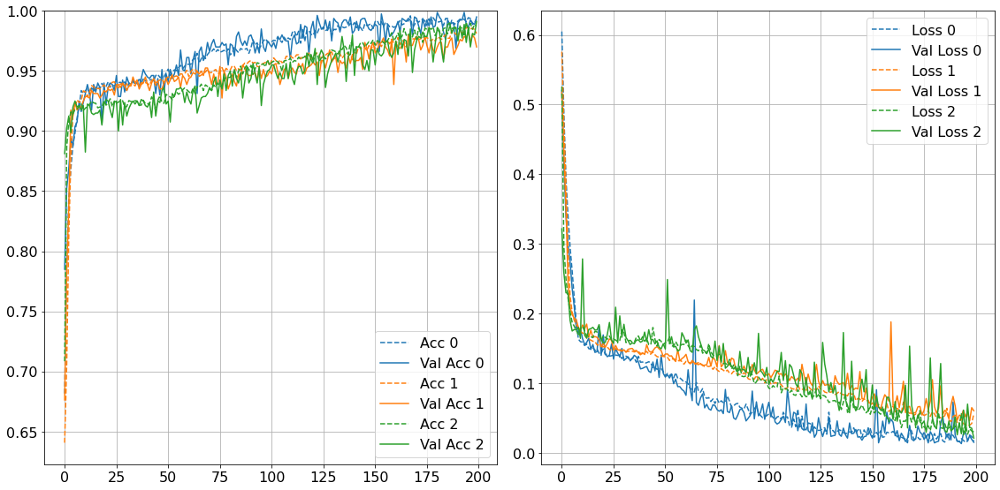

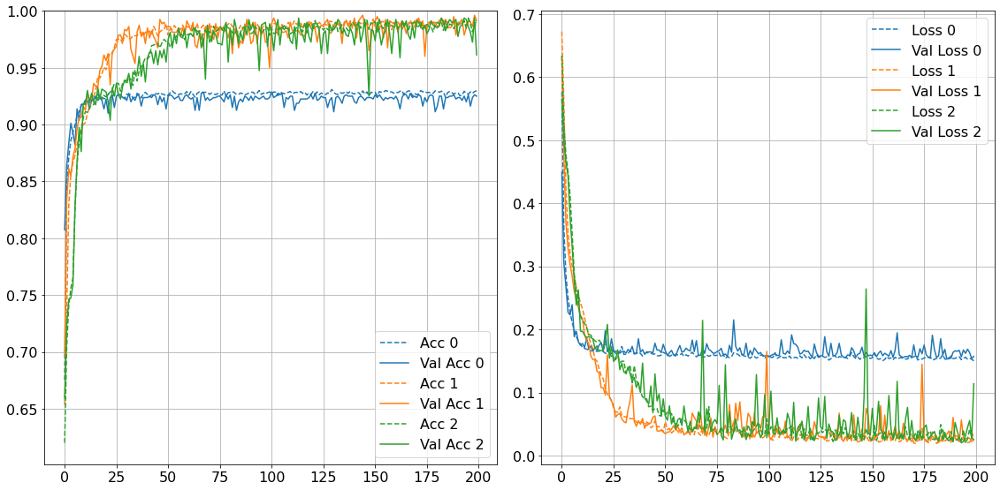

...

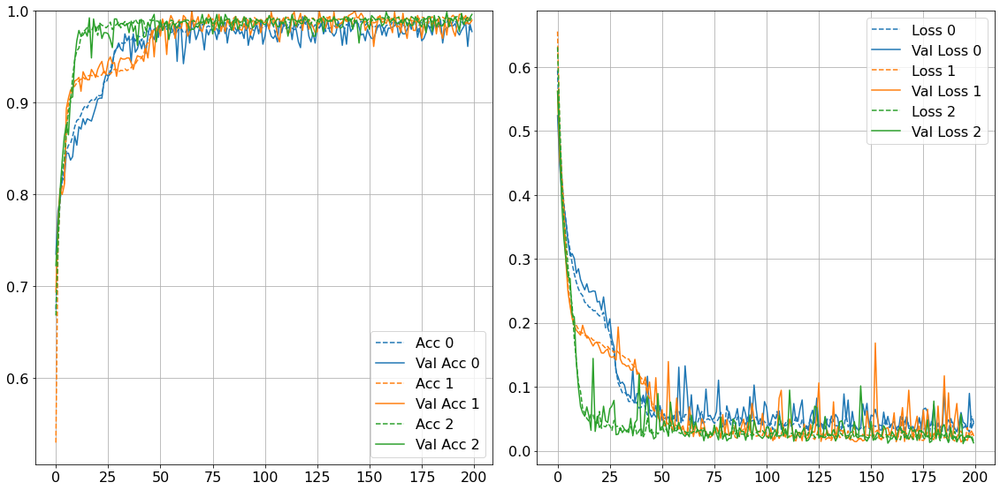

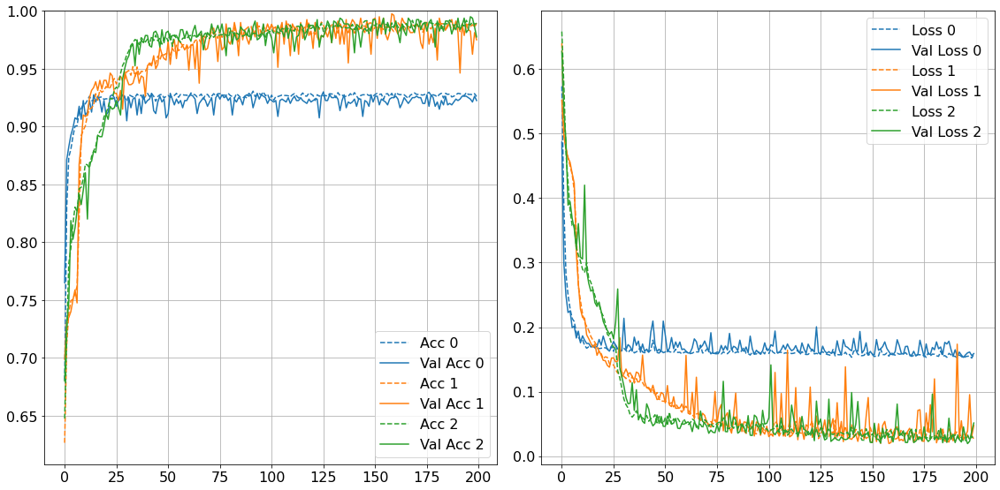

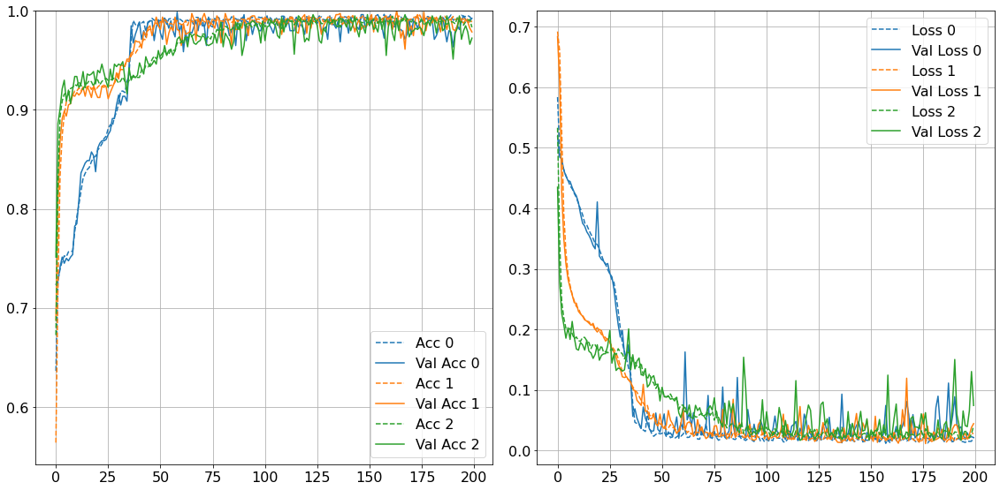

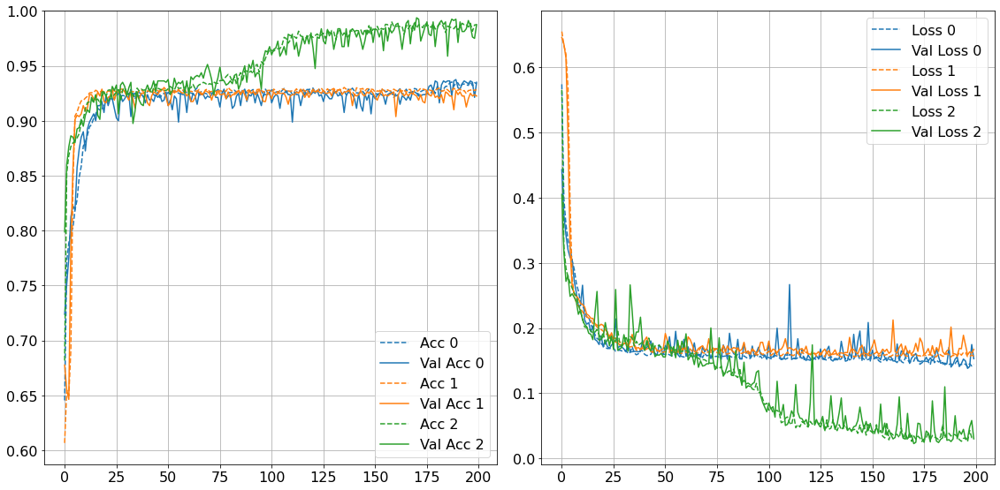

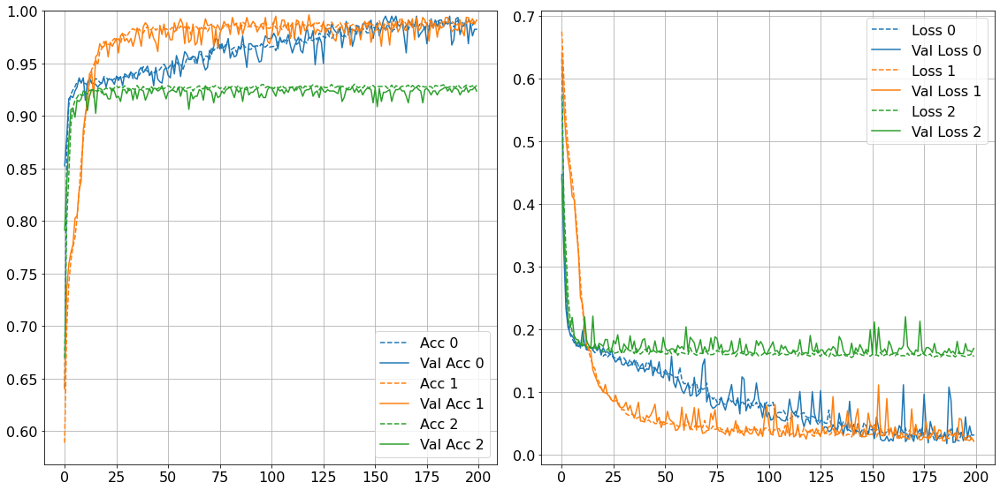

In [24]:
means = grid_arcitecture_result.cv_results_['mean_test_score']
permutation = means.argsort()
params_top3 = [grid_arcitecture_result.cv_results_['params'][permutation[i]] for i in range(-3,0)] 

fig,ax = plt.subplots(1,1,figsize=(8,8))
ax.boxplot(best_acc)
np.save(os.path.join("saved_models","architecture_acc_source_nepoch200_node20_hl4"),best_acc)
plt.savefig(os.path.join("figures","architecture_box.pdf"))

num = np.arange(3)

for i in range(3):
    print(np.average(best_acc[:,i]),np.std(best_acc[:,i]),params_top3[i])

for n in range(N_INIT_WEIGHTS):
    plot_fit_series(fits_architecture[n],num,lambda x: f" {x}")

### Optimal Training Parameters

In [12]:
batch_size = [16,64,128]
optimizers = ['Adam','RMSprop']
epochs = [100,200,400]

param_grid = dict(
    batch_size =batch_size,
    optimizer = optimizers,
    epochs = epochs
)


x_train,y_train,x_valid,y_valid = create_datasets()



model_training_search = KerasClassifier(
    build_fn=create_model,
    verbose = 0,
    )

grid_training = GridSearchCV(model_training_search,
    param_grid = param_grid,
    verbose=0
     )

grid_training_result = grid_training.fit(
    x_train,y_train,
    validation_data=(x_valid,y_valid),
    verbose = 0,
    )


In [13]:
# results_training = pd.DataFrame.from_dict(grid_training_result.cv_results_)
# results_training.to_csv(os.path.join("saved_models",'grid_search_training_results.csv'))

print_grid_search_results(grid_training_result)

0.950937 (0.028066) in 6.520245 (0.028066) s with: {'batch_size': 128, 'epochs': 200, 'optimizer': 'Adam'}
0.952188 (0.025932) in 9.118901 (0.025932) s with: {'batch_size': 64, 'epochs': 200, 'optimizer': 'Adam'}
0.952500 (0.027486) in 13.481787 (0.027486) s with: {'batch_size': 16, 'epochs': 100, 'optimizer': 'Adam'}
0.955937 (0.026246) in 51.697382 (0.026246) s with: {'batch_size': 16, 'epochs': 400, 'optimizer': 'RMSprop'}
0.960625 (0.026022) in 11.902903 (0.026022) s with: {'batch_size': 128, 'epochs': 400, 'optimizer': 'Adam'}
0.961875 (0.023125) in 9.215262 (0.023125) s with: {'batch_size': 64, 'epochs': 200, 'optimizer': 'RMSprop'}
0.963437 (0.026674) in 26.264241 (0.026674) s with: {'batch_size': 16, 'epochs': 200, 'optimizer': 'Adam'}
0.968437 (0.030513) in 52.242243 (0.030513) s with: {'batch_size': 16, 'epochs': 400, 'optimizer': 'Adam'}
0.976250 (0.011668) in 17.668564 (0.011668) s with: {'batch_size': 64, 'epochs': 400, 'optimizer': 'RMSprop'}
0.986875 (0.011465) in 17.255

In [14]:
means = grid_training_result.cv_results_['mean_test_score']

permutation = means.argsort()
params_top3 = [grid_training_result.cv_results_['params'][permutation[i]] for i in range(-3,0)] 
fits_training = []

best_acc_training = np.zeros((N_INIT_WEIGHTS,len(params_top3)))
for n in range(N_INIT_WEIGHTS):
    fits_current = []
    for i,params_top in enumerate(params_top3):
        model = create_model(          
            optimizer = params_top["optimizer"],
            )

        model.load_weights(weights_def_filepath(n))

        fits_current.append(model.fit(x_train,y_train,
            epochs = params_top["epochs"],
            batch_size = params_top["batch_size"],
            validation_data=(x_valid,y_valid),
            verbose = 0))

        best_acc_training[n,i] = np.max(fits_current[-1].history["val_accuracy"])
    fits_training.append(fits_current)
    print(f"Done {n+1}/{N_INIT_WEIGHTS}")
    

Done 1/10
Done 2/10
Done 3/10
Done 4/10
Done 5/10
Done 6/10
Done 7/10
Done 8/10
Done 9/10
Done 10/10


0.9646249890327454 0.0339763195408988 {'batch_size': 16, 'epochs': 400, 'optimizer': 'Adam'}
0.9501249969005585 0.030297739248760325 {'batch_size': 64, 'epochs': 400, 'optimizer': 'RMSprop'}
0.9608749926090241 0.029085269869087764 {'batch_size': 64, 'epochs': 400, 'optimizer': 'Adam'}


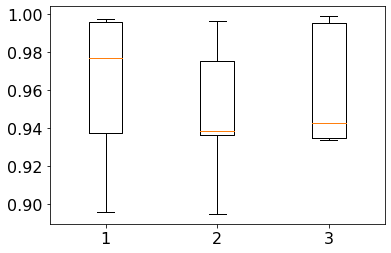

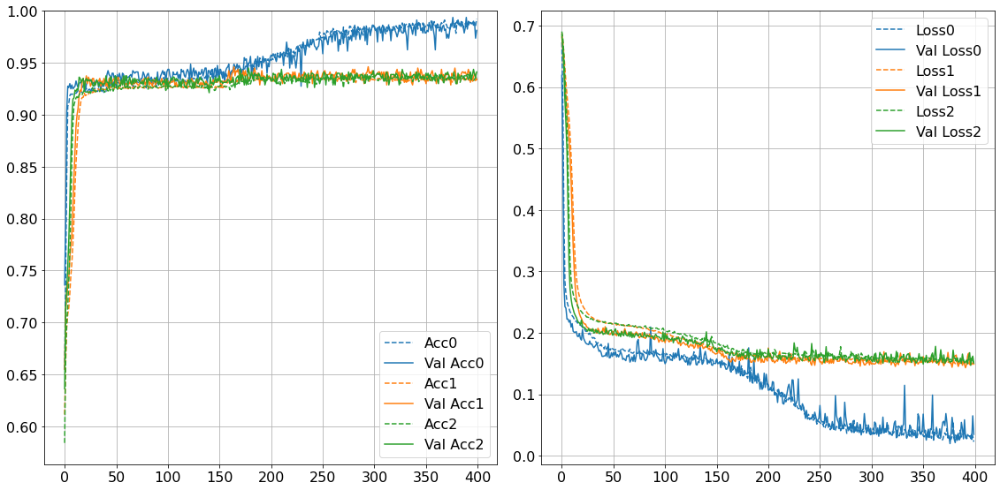

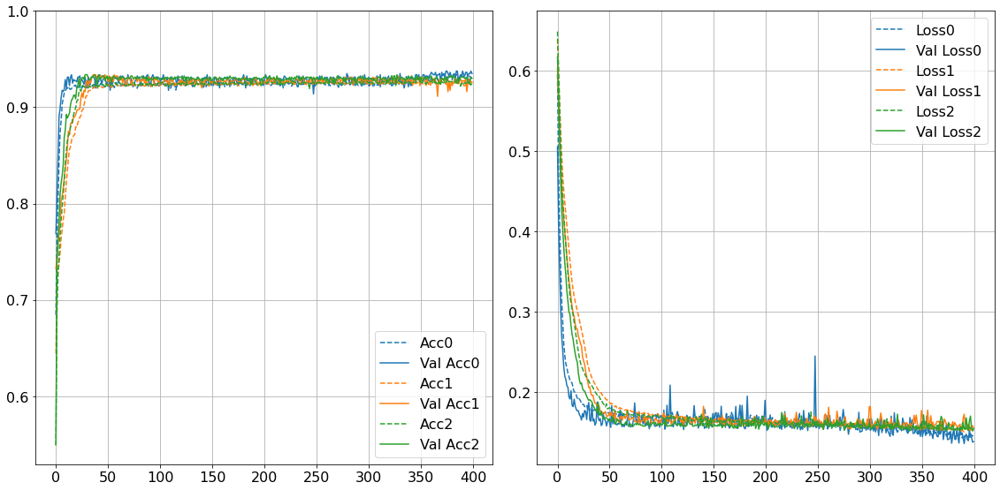

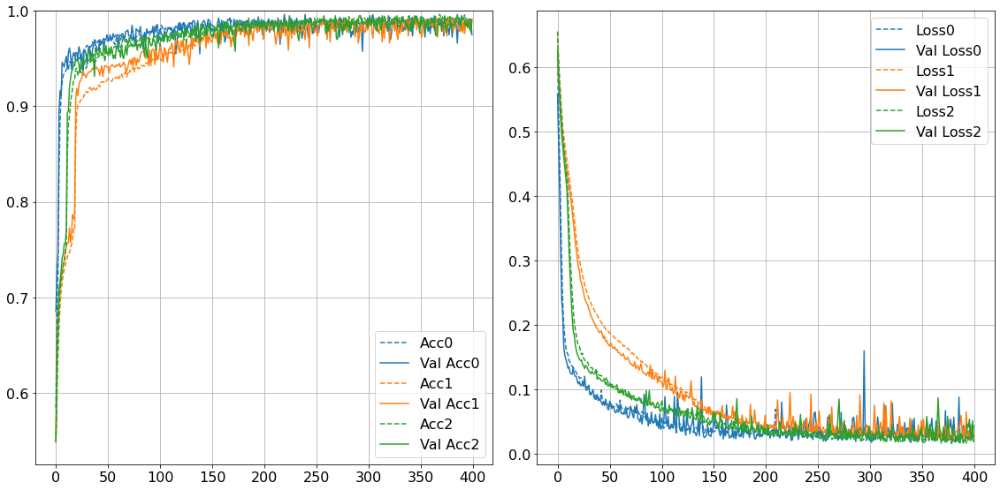

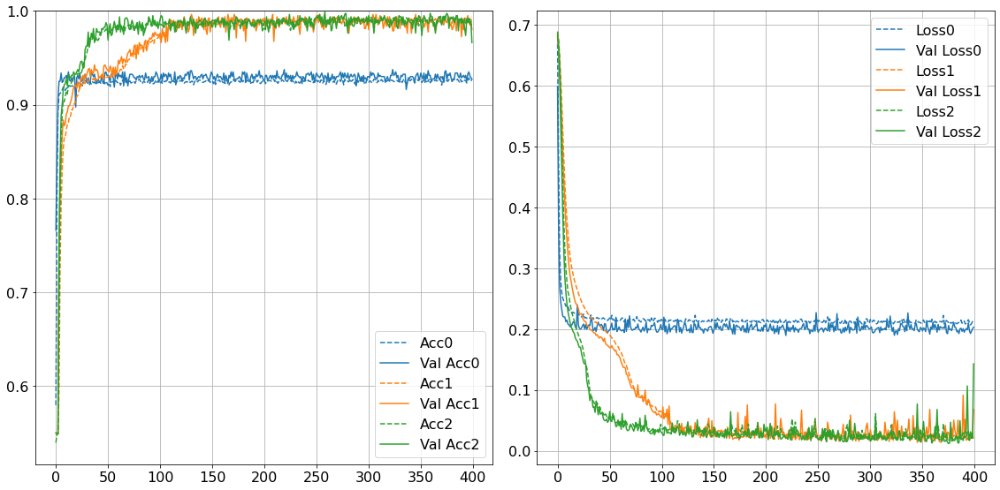

...

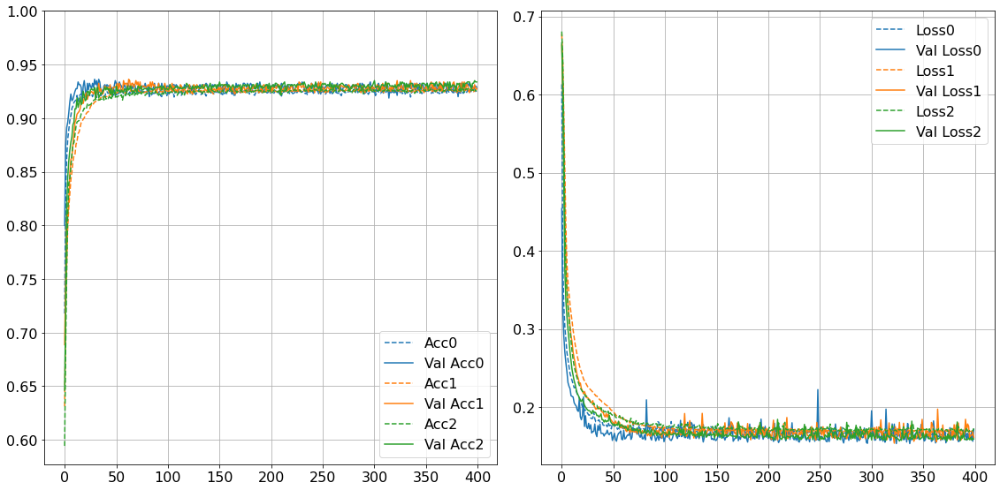

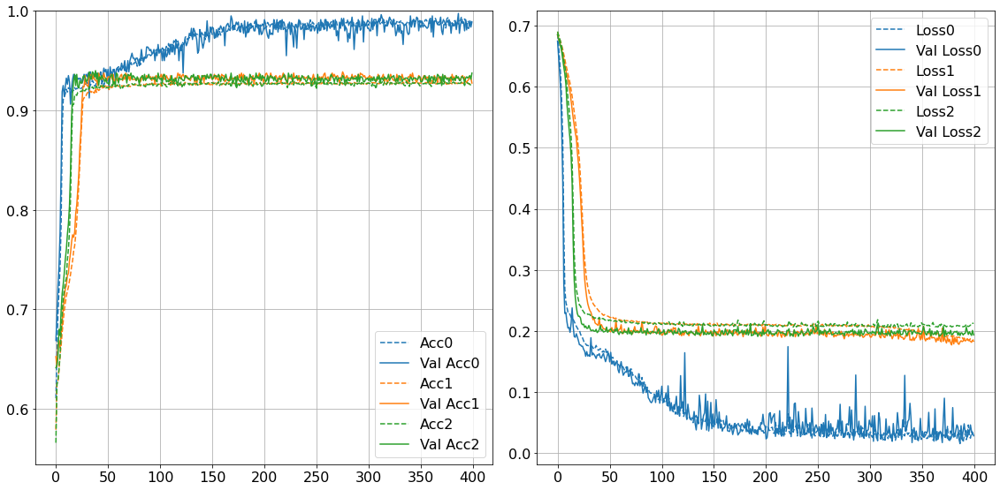

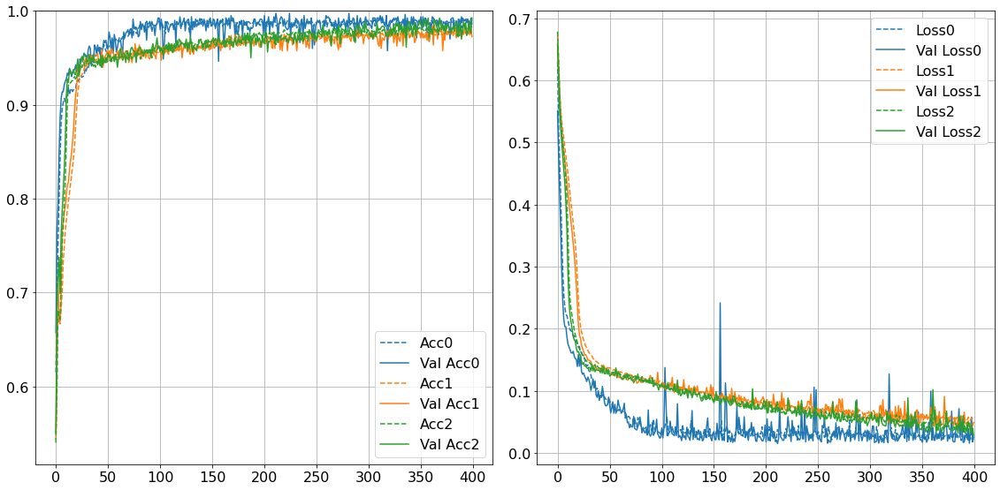

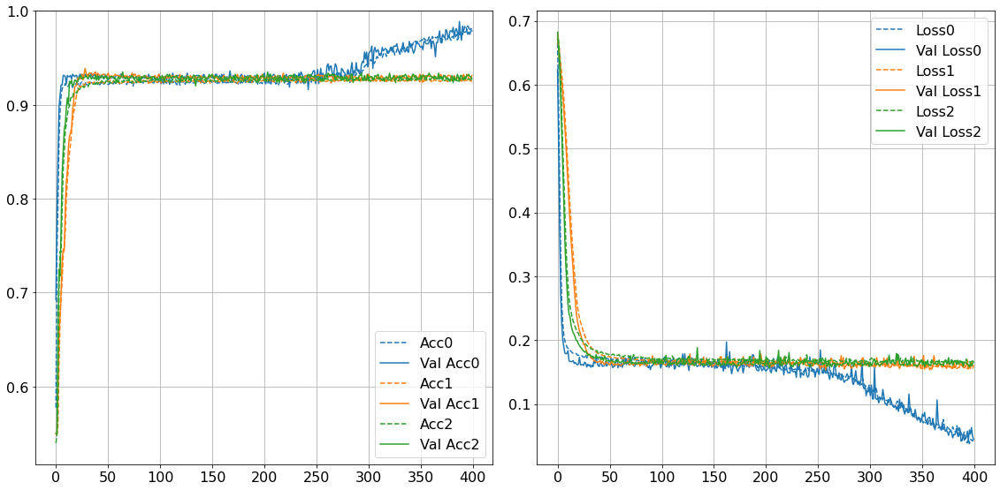

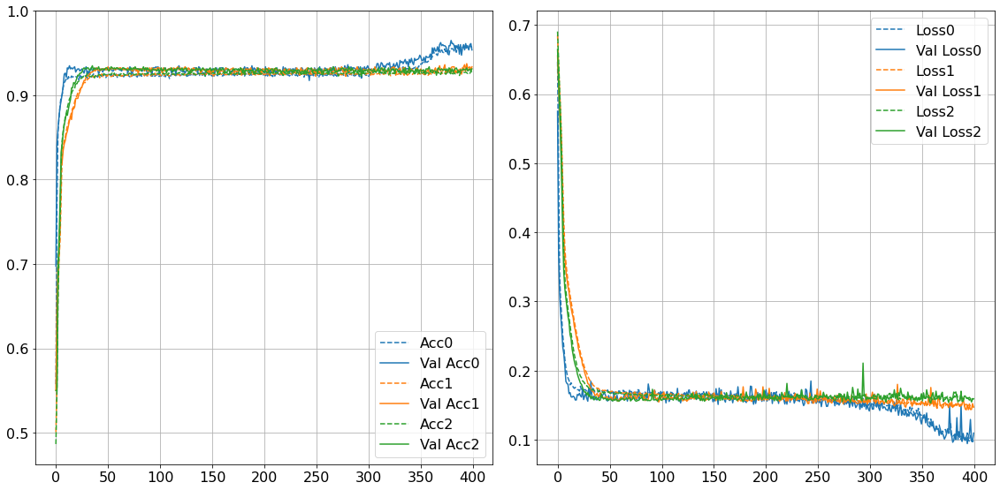

In [23]:
means = grid_training_result.cv_results_['mean_test_score']
permutation = means.argsort()
params_top3 = [grid_training_result.cv_results_['params'][permutation[i]] for i in range(-3,0)] 

num = np.arange(3)
for i in range(3):
    print(np.average(best_acc_training[:,i]),np.std(best_acc_training[:,i]),params_top3[i])
np.save(os.path.join("saved_models","training_acc_source_nepoch200_node20_hl4"),best_acc_training)
plt.boxplot(best_acc_training)
plt.savefig(os.path.join("figures","training_box.pdf"))
plt.show()
for n in range(N_INIT_WEIGHTS):
    plot_fit_series(fits_training[n],num,lambda x: f"{x}")

## Rescaling

In [16]:
model = create_model()

rtypes = [0,1,2]
type_names = ["/50","normalize","standarize"]

opt_acc_rescale = np.zeros((N_INIT_WEIGHTS,len(type_names)))
fits_rescale = []

for n in range(N_INIT_WEIGHTS):
    fits_current = []
    for m,rtype in enumerate(rtypes):
        model.load_weights(weights_def_filepath(n))
        
        x_train,y_train,x_valid,y_valid = create_datasets(RTYPE=rtype)

        fits_current.append(
            model.fit(x_train,y_train,
            batch_size=BATCH_SIZE,
            epochs=EPOCHS,
            validation_data= (x_valid,y_valid),
            verbose = 0,
            )
        )
        opt_acc_rescale[n,m] = np.max(fits_current[-1].history["val_accuracy"])
    
    fits_rescale.append(fits_current)
    print(f"Done {n+1}/{N_INIT_WEIGHTS}")

Done 1/10
Done 2/10
Done 3/10
Done 4/10
Done 5/10
Done 6/10
Done 7/10
Done 8/10
Done 9/10
Done 10/10


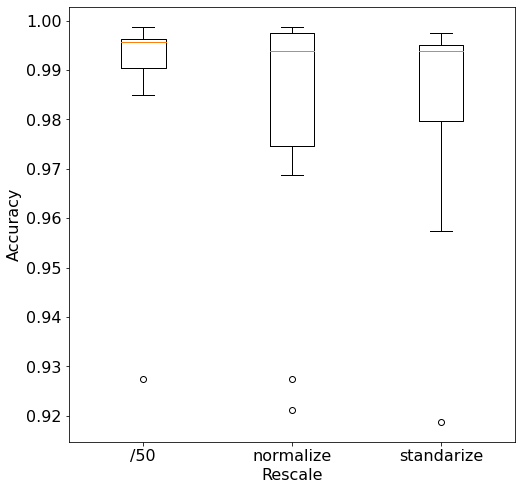

Initial weights 0


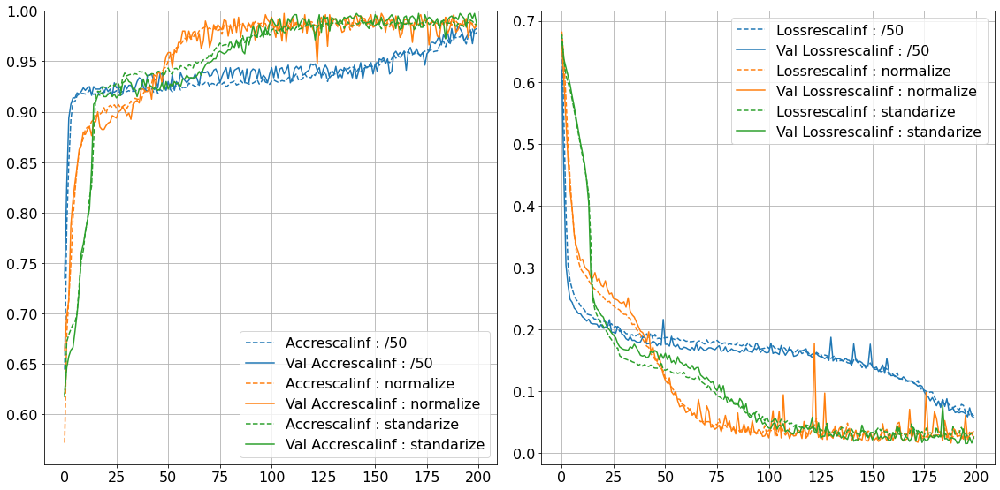

Initial weights 1


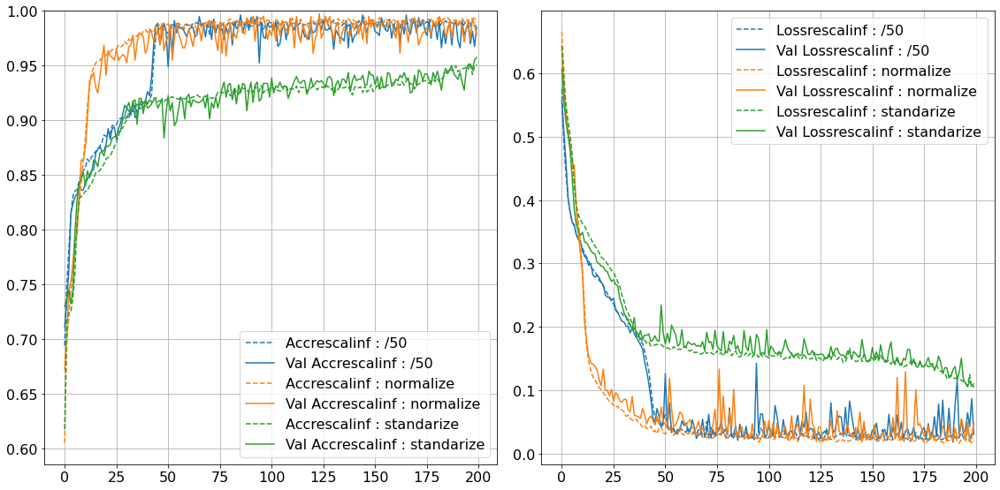

Initial weights 2


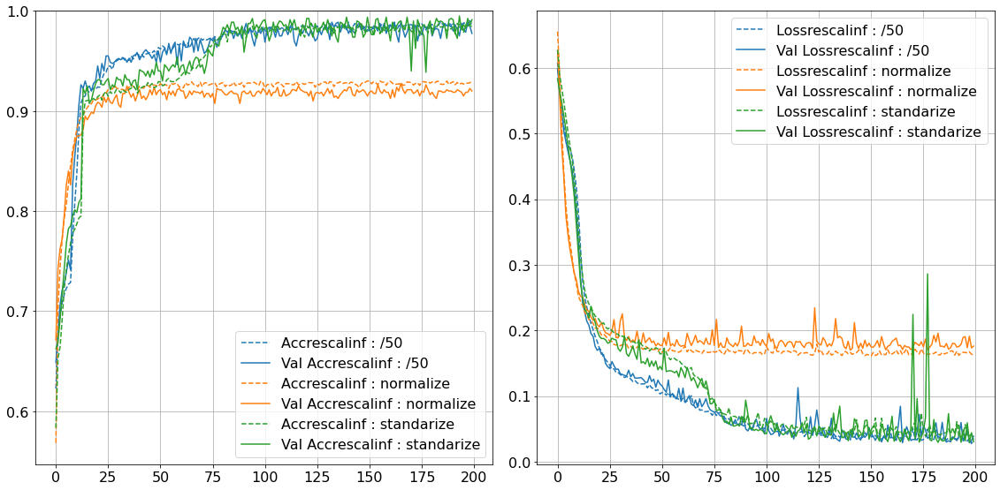

Initial weights 3


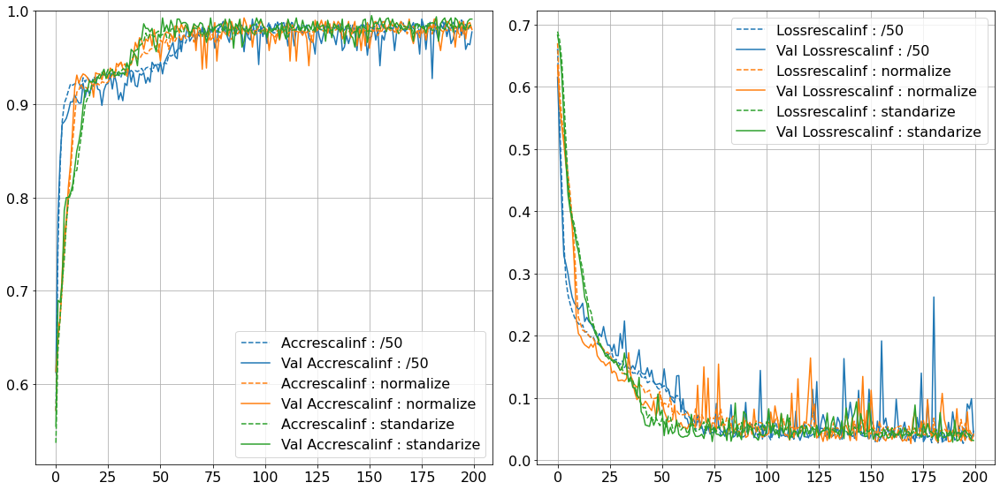

Initial weights 4


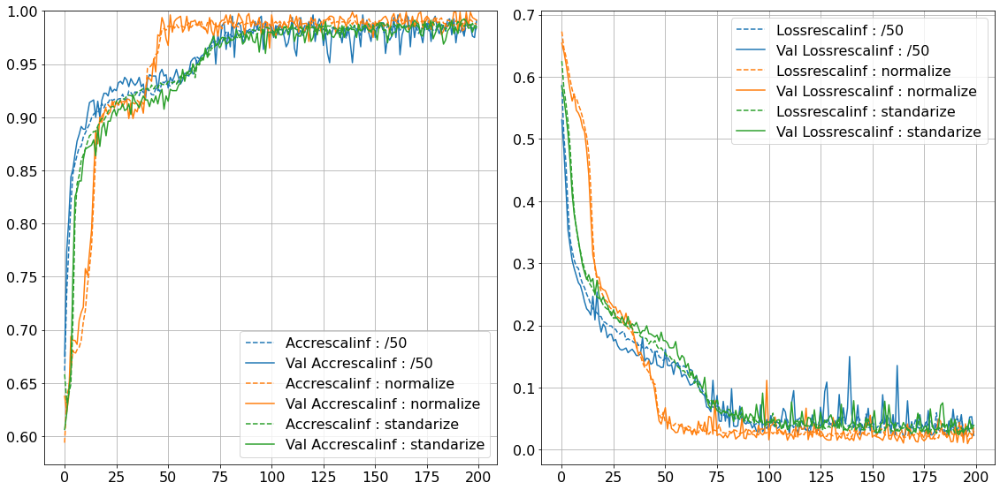

Initial weights 5


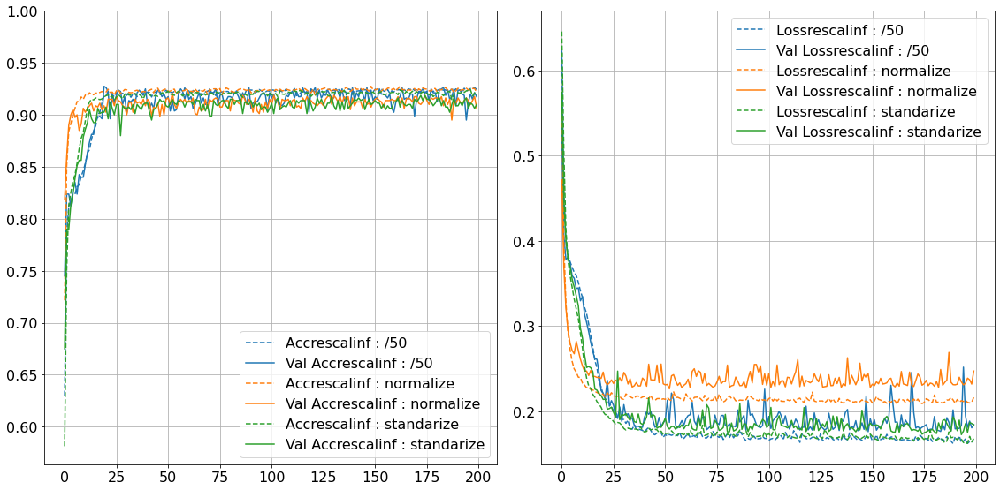

Initial weights 6


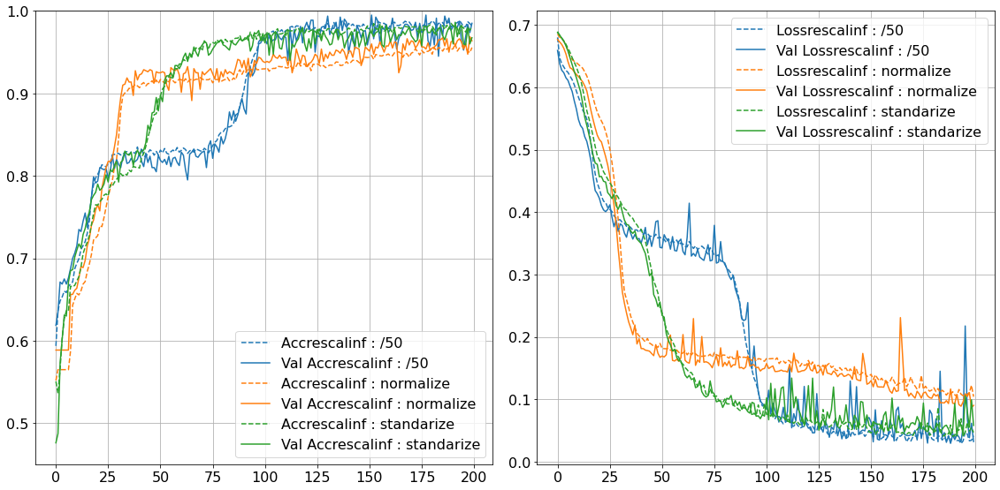

Initial weights 7


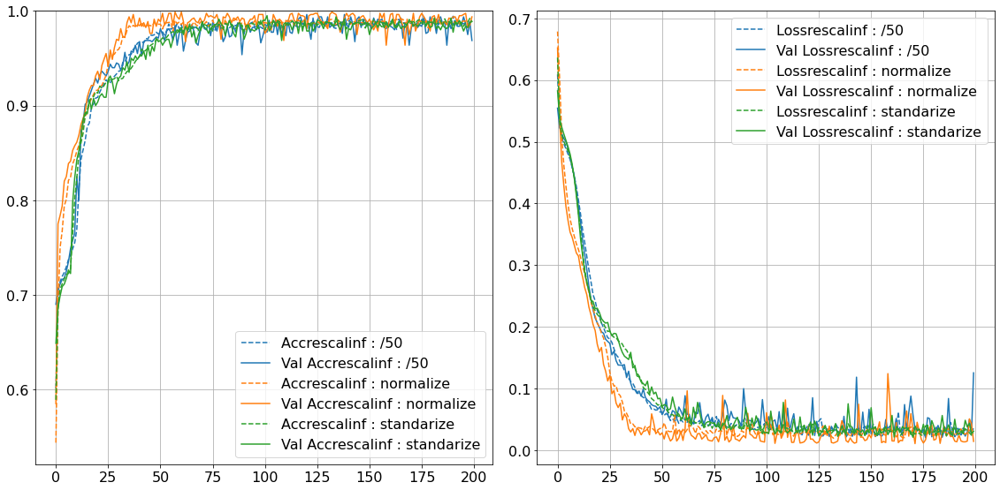

Initial weights 8


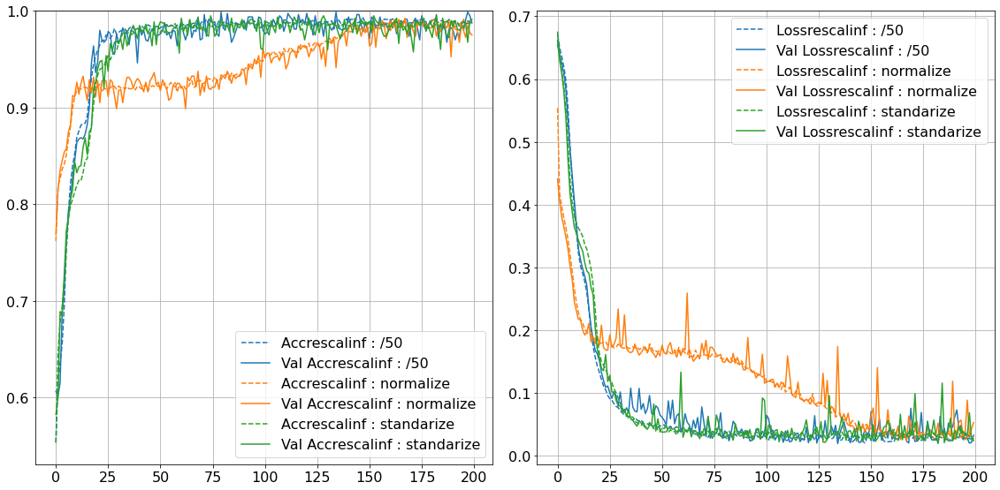

Initial weights 9


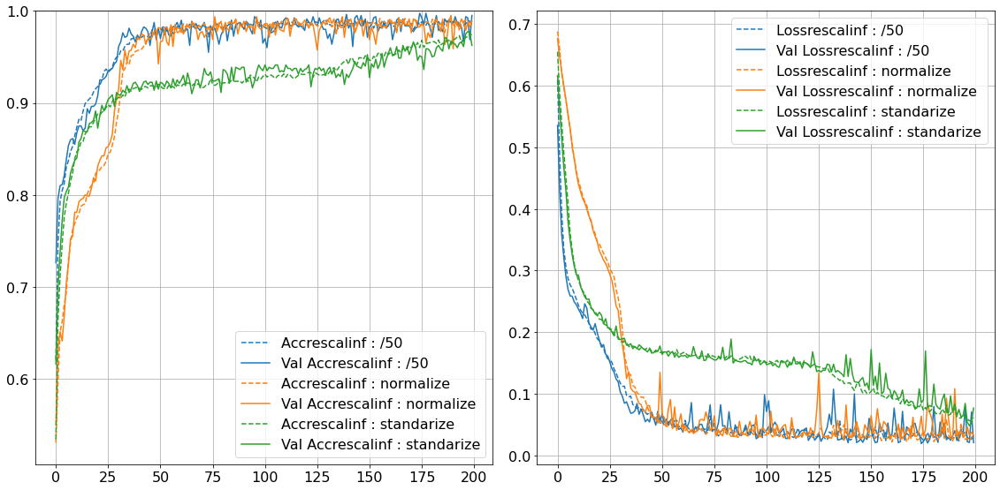

In [21]:
fig,ax = plt.subplots(1,1,figsize = (8,8))
np.save(os.path.join("saved_models","rescale_acc_source_nepoch200_node20_hl4"),opt_acc_rescale)
ax.boxplot(opt_acc_rescale)
ax.set_xticklabels(type_names)
ax.set_xlabel("Rescale")
ax.set_ylabel("Accuracy")
plt.savefig(os.path.join("figures","rescale_box.pdf"))
plt.show()

for n in range(N_INIT_WEIGHTS):
    print(f"Initial weights {n}")
    plot_fit_series(fits_rescale[n],type_names ,lambda x: f"rescalinf : {x}")

## Initzialization

In [18]:
model = create_model()

weights_inits = ["glorot_uniform","glorot_normal","he_uniform","he_normal"]

opt_acc_init = np.zeros((N_INIT_WEIGHTS,len(weights_inits)))
fits_init = []

x_train,y_train,x_valid,y_valid = create_datasets()

for n in range(N_INIT_WEIGHTS):
    fits_current = []
    for m,weight_init in enumerate(weights_inits):
        model = create_model(weight_init = weight_init)
    
        fits_current.append(model.fit(x_train,y_train,
            batch_size=BATCH_SIZE,
            epochs=EPOCHS,
            validation_data= (x_valid,y_valid),
            verbose = 0,
            )
        )
        opt_acc_init[n,m] = np.max(fits_current[-1].history["val_accuracy"])
    fits_init.append(fits_current)
    
    print(f"Done {n+1}/{N_INIT_WEIGHTS}")

Done 1/10
Done 2/10
Done 3/10
Done 4/10
Done 5/10
Done 6/10
Done 7/10
Done 8/10
Done 9/10
Done 10/10


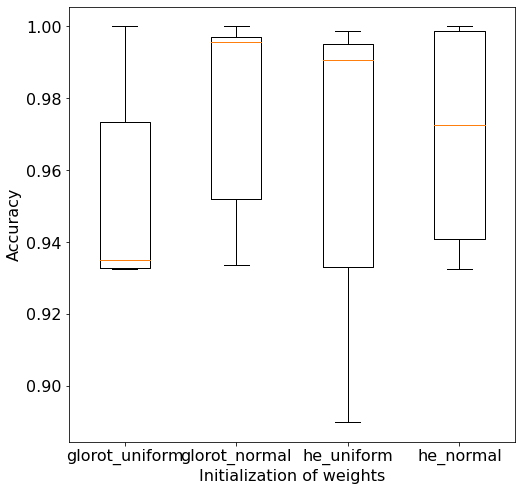

Initial weights 0


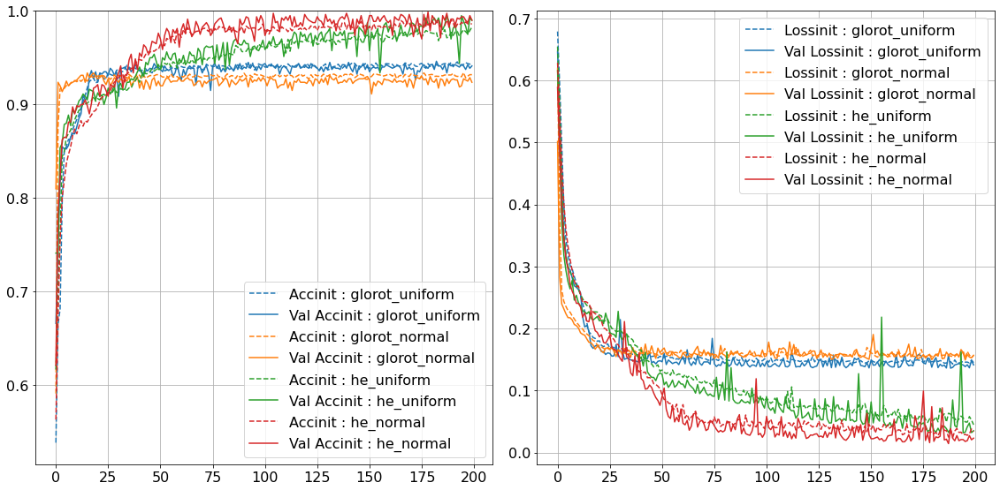

Initial weights 1


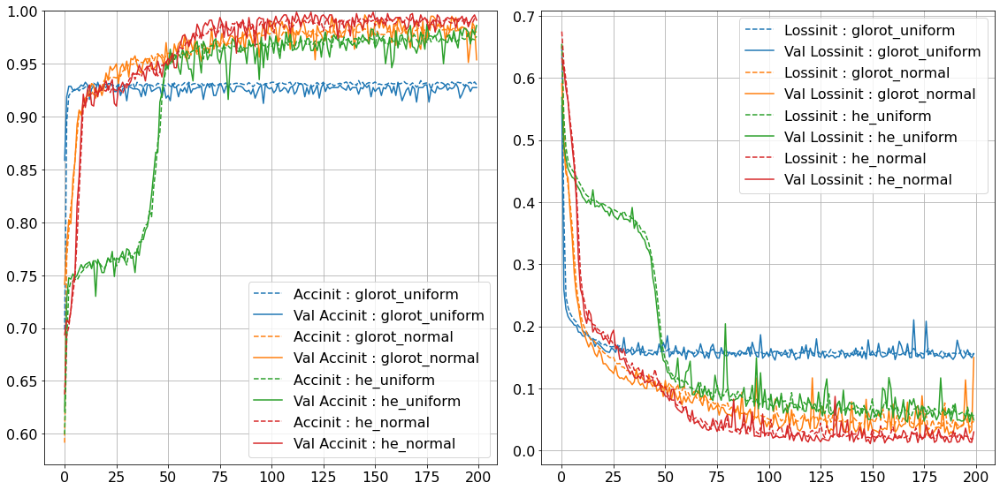

Initial weights 2


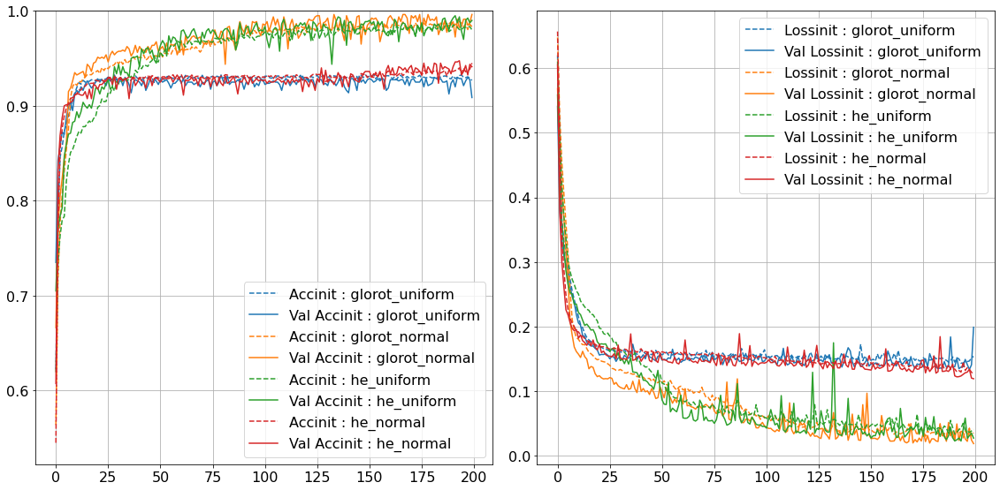

Initial weights 3


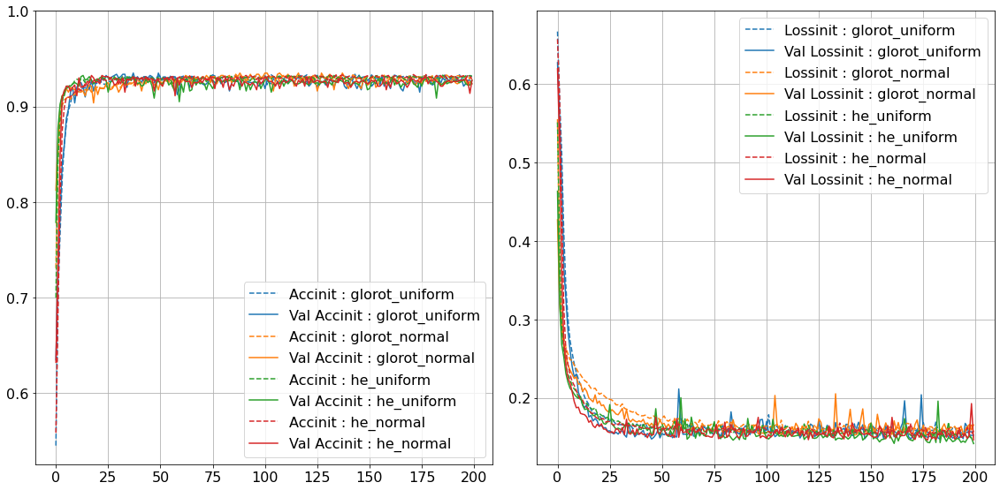

Initial weights 4


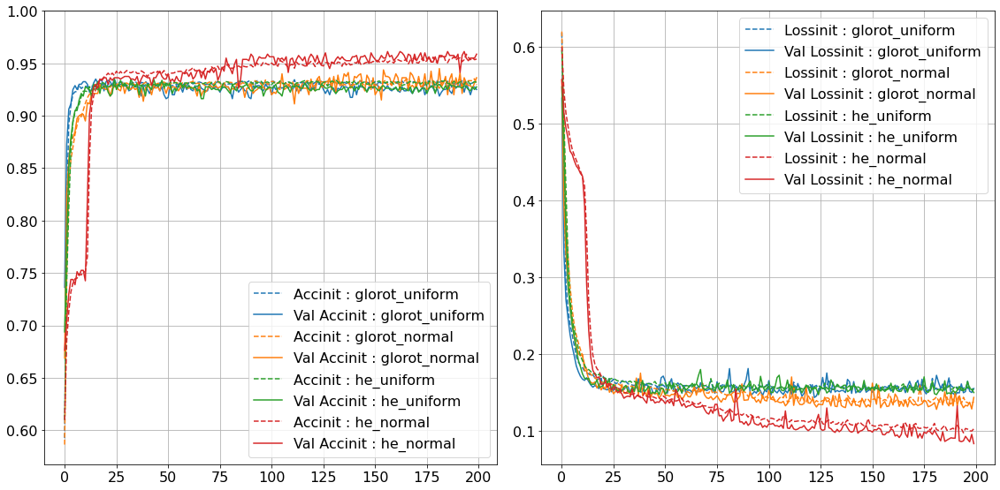

Initial weights 5


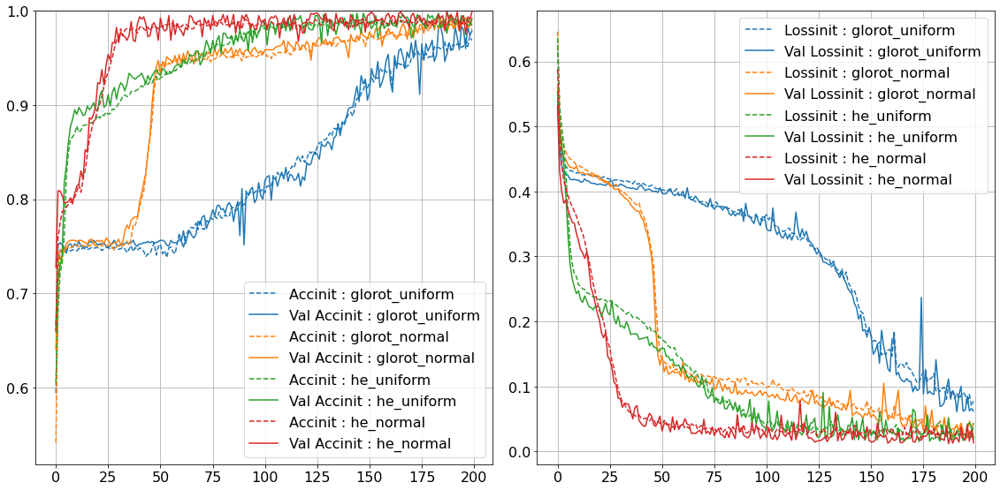

Initial weights 6


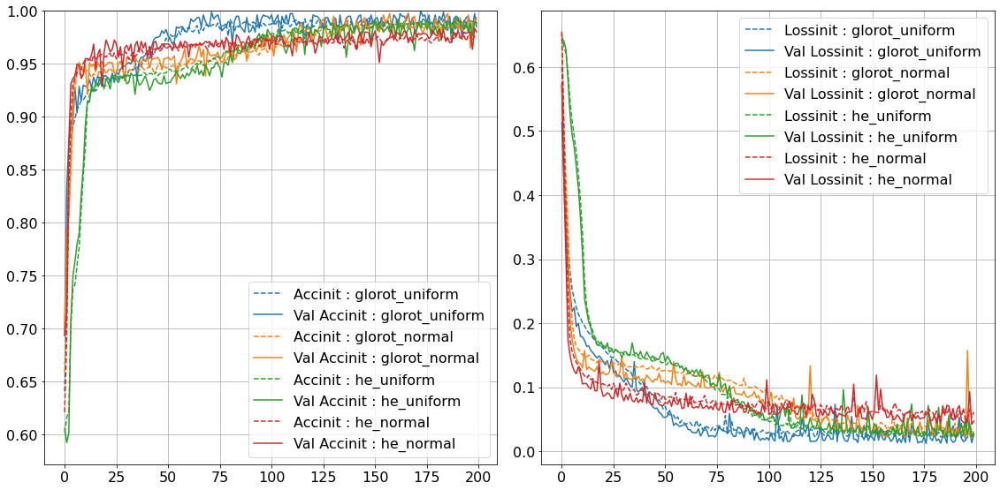

Initial weights 7


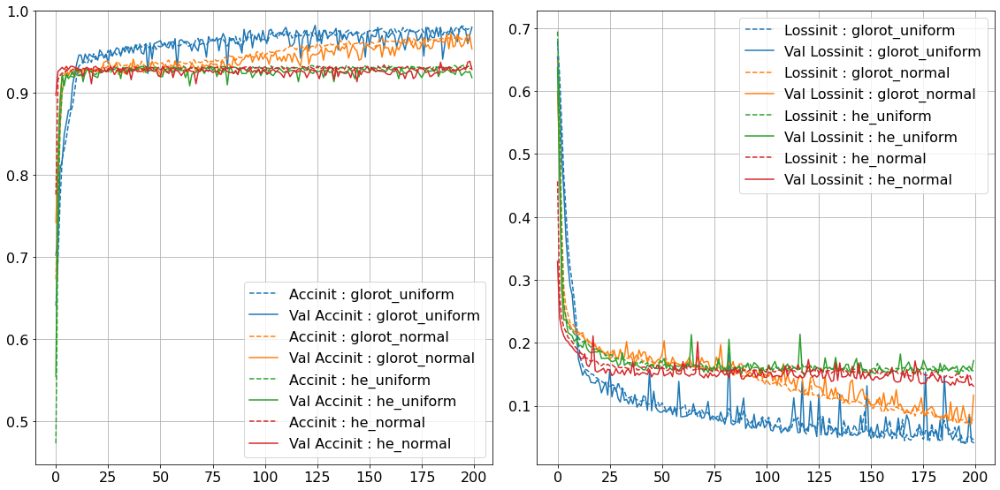

Initial weights 8


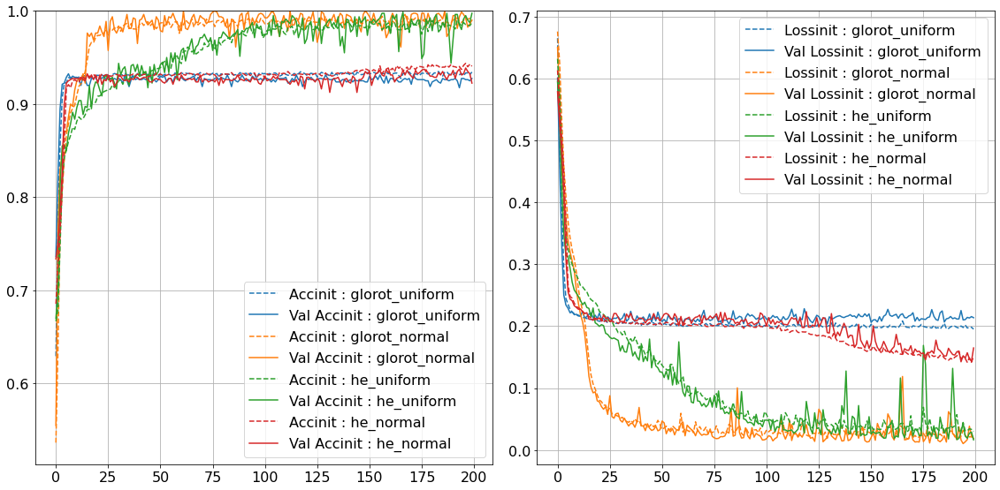

Initial weights 9


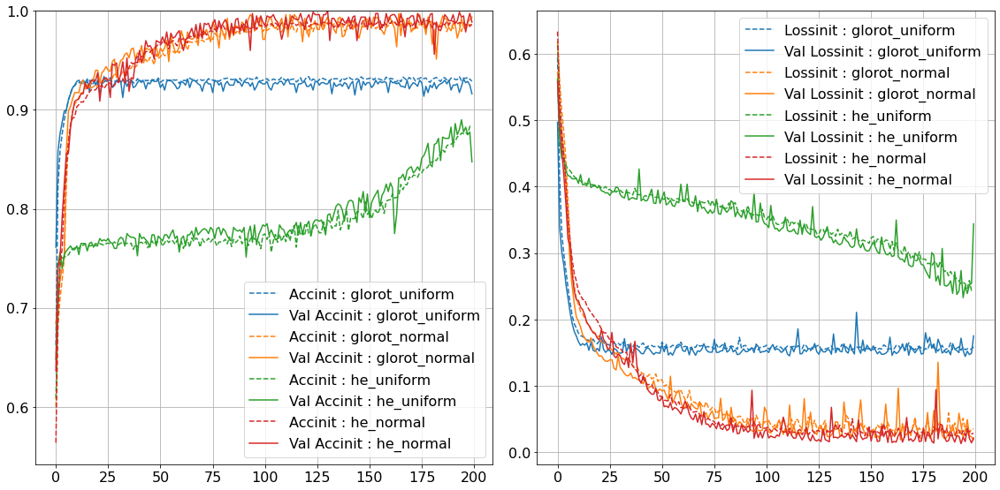

In [20]:
fig,ax = plt.subplots(1,1,figsize = (8,8))
np.save(os.path.join("saved_models","init_weights_acc_source_nepoch200_node20_hl4"),opt_acc_init)
ax.boxplot(opt_acc_init)
ax.set_xticklabels(weights_inits)
ax.set_xlabel("Initialization of weights")
ax.set_ylabel("Accuracy")
plt.savefig(os.path.join("figures","init_weights_box.pdf"))
plt.show()

for n in range(N_INIT_WEIGHTS):
    print(f"Initial weights {n}")
    plot_fit_series(fits_init[n],weights_inits,lambda x: f"init : {x}")

## Testing model on other data

In [36]:
model = create_model()

types = [0,1,2]

opt_acc_circ = np.zeros((N_INIT_WEIGHTS,len(types)))
fits_circ = []



for n in range(N_INIT_WEIGHTS):
    fits_current = []
    for TYPE in types:
        x_train,y_train,x_valid,y_valid = create_datasets(TYPE=TYPE)
        model.load_weights(weights_def_filepath(n))

        fits_current.append(model.fit(x_train,y_train,
            batch_size=BATCH_SIZE,
            epochs=EPOCHS,
            validation_data= (x_valid,y_valid),
            verbose = 0,
            )
        )
        opt_acc_circ[n,TYPE] = np.max(fits_current[-1].history["val_accuracy"])
    
    fits_circ.append(fits_current)
    print(f"Done {n+1}/{N_INIT_WEIGHTS}")


Done 1/10
Done 2/10
Done 3/10
Done 4/10
Done 5/10
Done 6/10
Done 7/10
Done 8/10
Done 9/10
Done 10/10


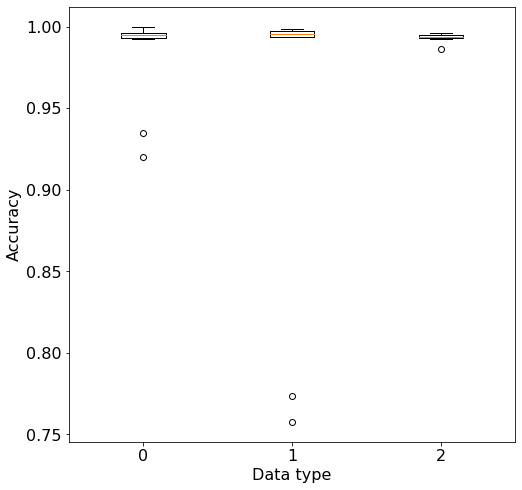

Initial weights 0


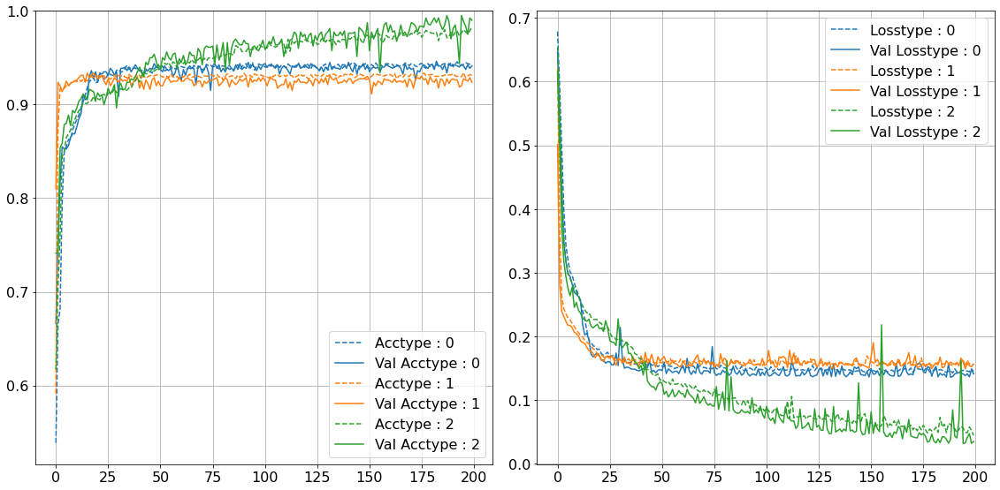

Initial weights 1


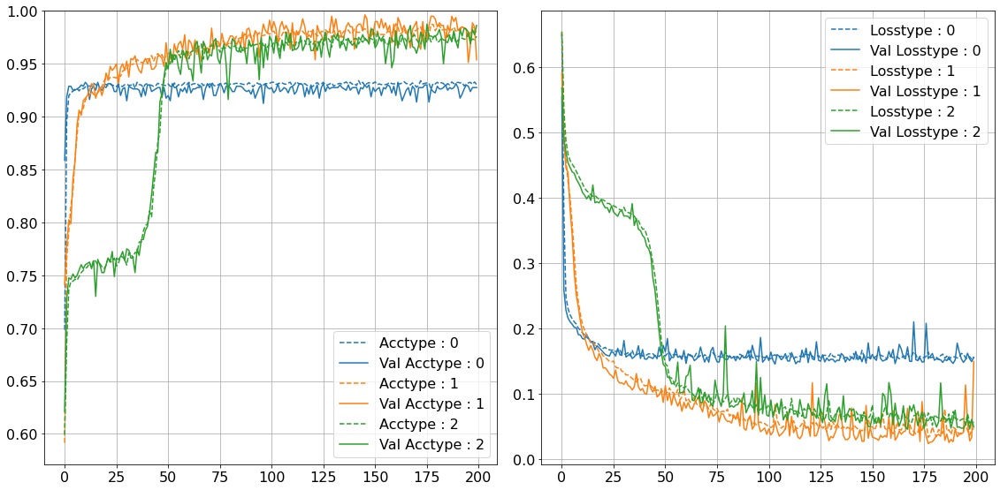

Initial weights 2


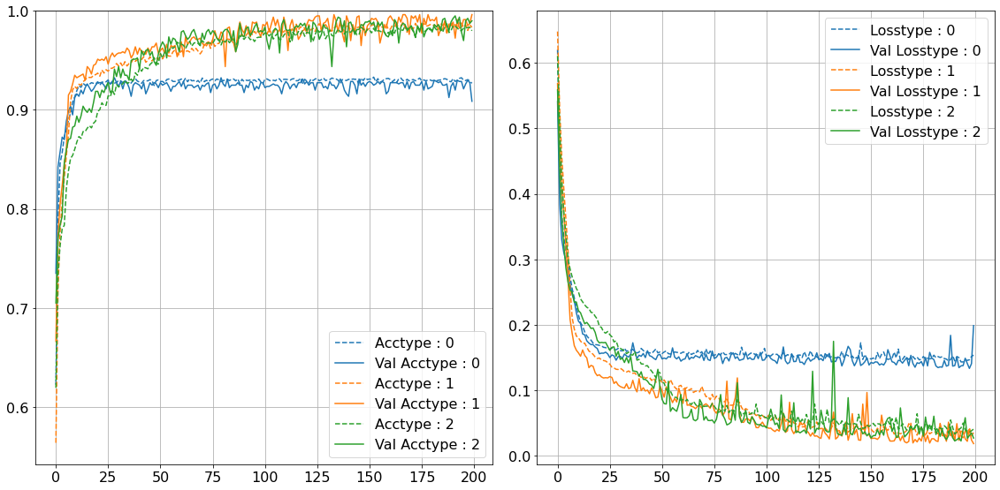

Initial weights 3


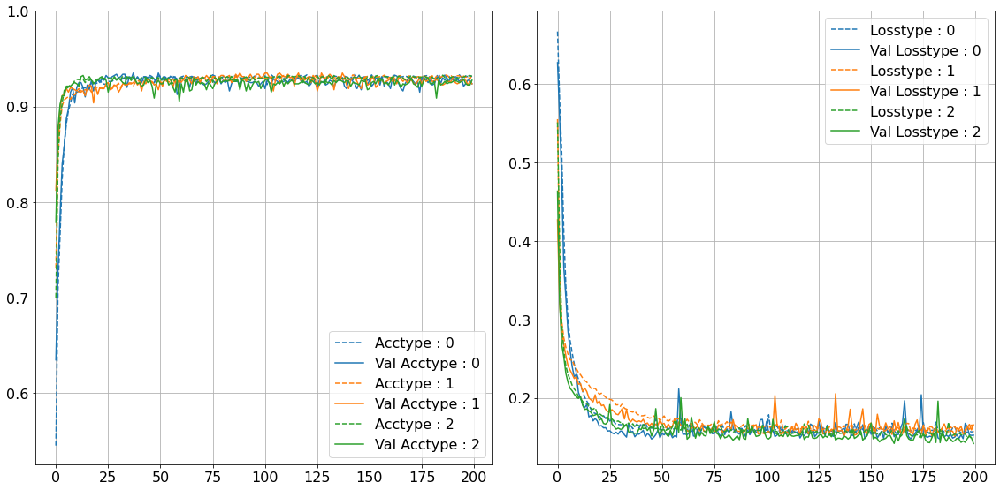

Initial weights 4


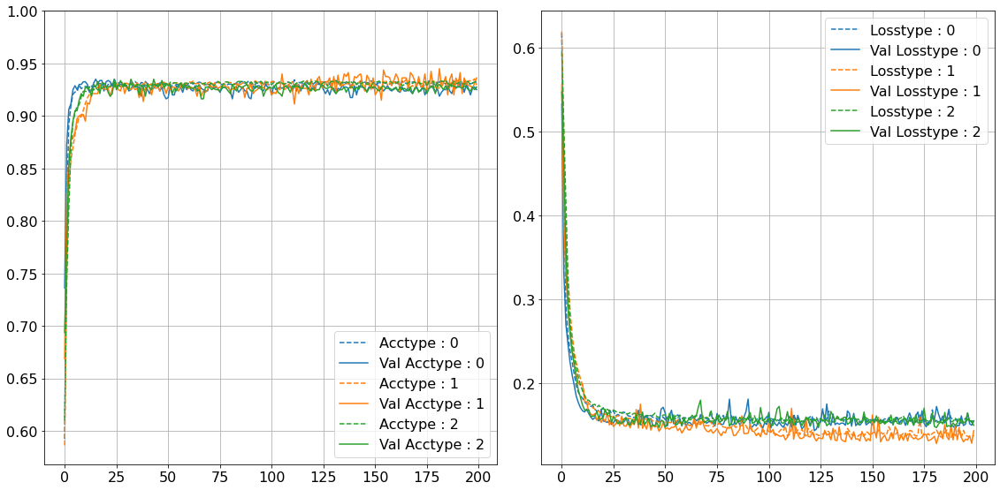

Initial weights 5


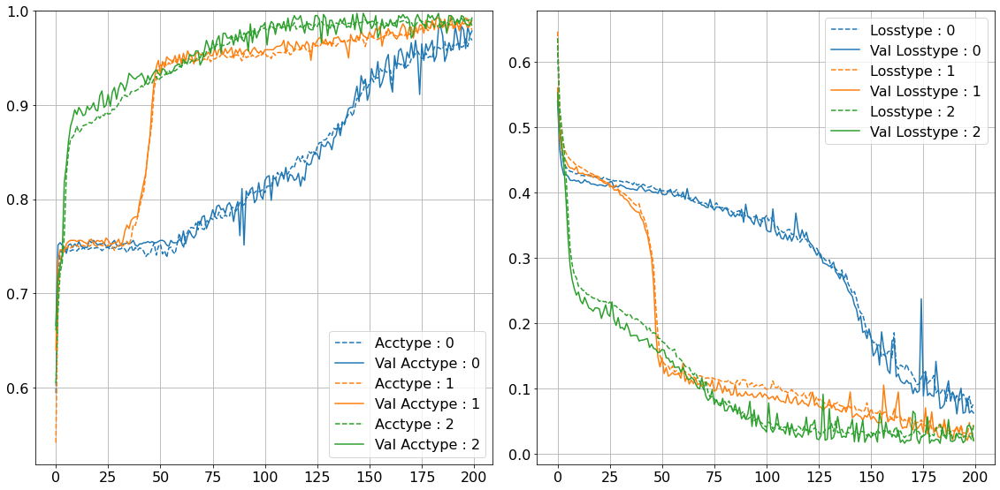

Initial weights 6


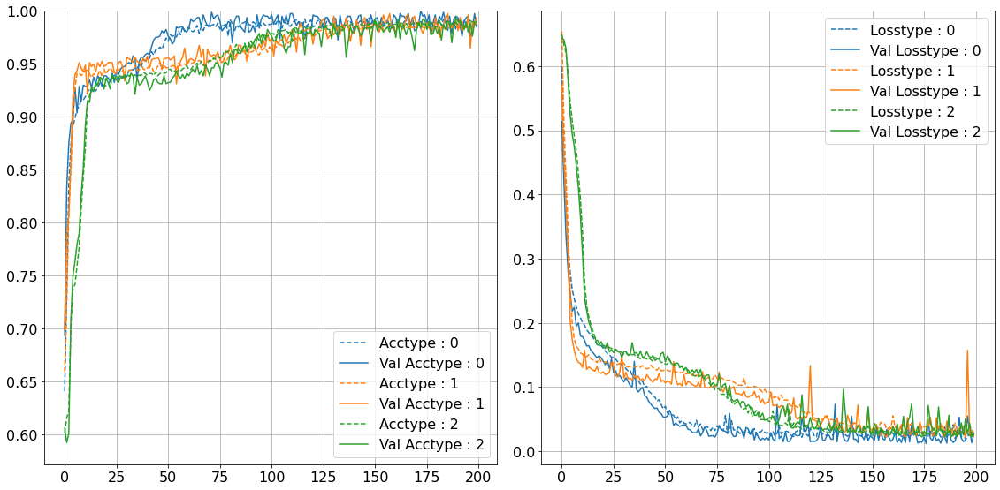

Initial weights 7


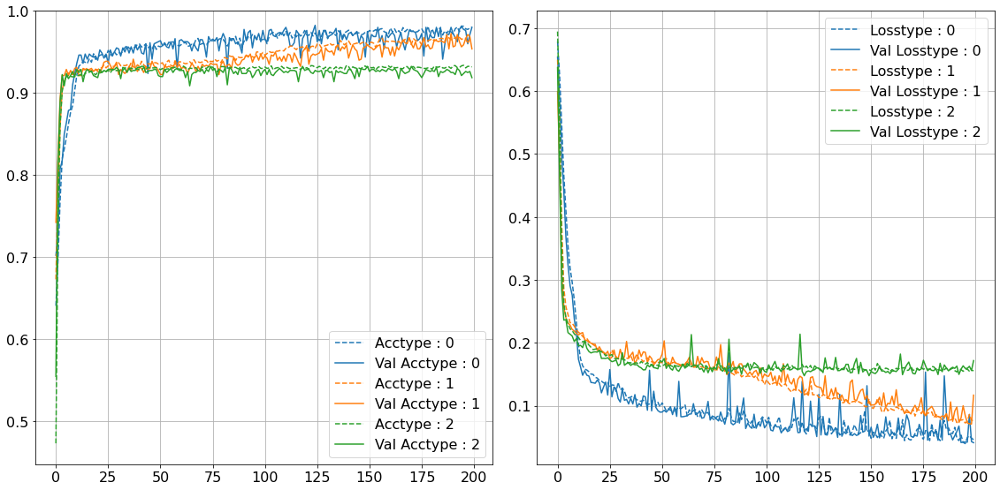

Initial weights 8


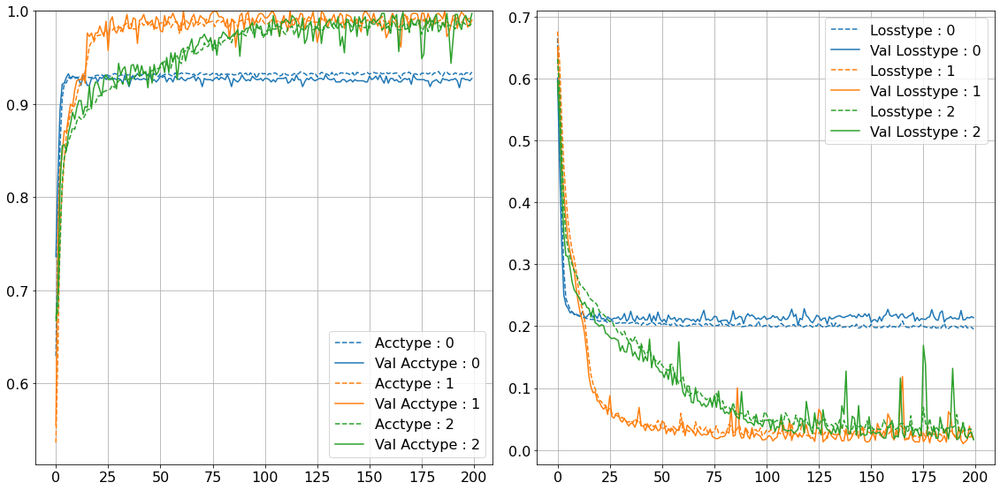

Initial weights 9


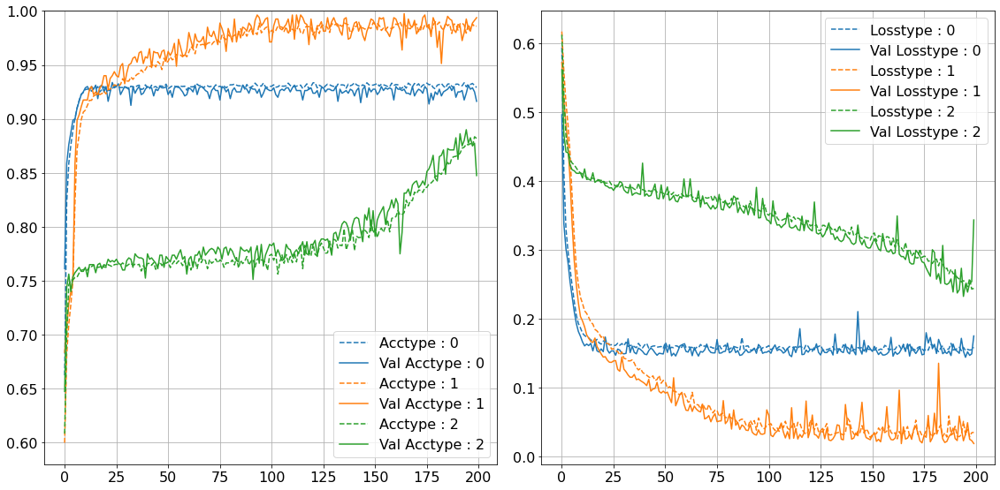

In [37]:
fig,ax = plt.subplots(1,1,figsize = (8,8))
# np.save(os.path.join("saved_models","types_acc_source_nepoch200_node20_hl4"),opt_acc_circ)
ax.boxplot(opt_acc_circ)
ax.set_xticklabels(types)
ax.set_xlabel("Data type")
ax.set_ylabel("Accuracy")
# plt.savefig(os.path.join("figures","types_box.pdf"))
plt.show()

for n in range(N_INIT_WEIGHTS):
    print(f"Initial weights {n}")
    plot_fit_series(fits_init[n],types,lambda x: f"type : {x}")